# Sistema de Detección de Somnolencia y Fatiga en Tiempo Real
>**Universidad Nacional de Trujillo - 2026**

> **Curso:** Percepción y Visión por Computadora — Ciclo VII   
> **Desarrollado por:** Ramos, Darwin
---

###  Descripción del Proyecto:
Sistema de monitoreo biométrico e inspección secuencial en tiempo real. Utiliza mallas faciales 3D (**MediaPipe**) para la extracción geométrica de parámetros de ojo (EAR) y boca (MAR), junto con una **Red Neuronal Recurrente (LSTM)** para la clasificación de secuencias temporales de somnolencia.

---

## INSTALACIÓN DE LIBRERIAS



In [ ]:
# CELDA 1: CONTROL DE VERSIONES CONGELADAS
!pip uninstall -y mediapipe torch torchvision protobuf tensorflow
!pip install protobuf==4.25.3 typing-extensions==4.9.0 --quiet
!pip install mediapipe==0.10.14 torch==2.4.0 torchvision==0.19.0 --quiet

Found existing installation: torch 2.11.0+cpu
Uninstalling torch-2.11.0+cpu:
  Successfully uninstalled torch-2.11.0+cpu
Found existing installation: torchvision 0.26.0+cpu
Uninstalling torchvision-0.26.0+cpu:
  Successfully uninstalled torchvision-0.26.0+cpu
Found existing installation: protobuf 5.29.6
Uninstalling protobuf-5.29.6:
  Successfully uninstalled protobuf-5.29.6
Found existing installation: tensorflow 2.20.0
Uninstalling tensorflow-2.20.0:
  Successfully uninstalled tensorflow-2.20.0
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.6/294.6 kB 3.5 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
fastai 2.8.7 requires torch<3,>=1.10, which is not installed.
fastai 2.8.7 requires torchvision>=0.11, which is not installed.
timm 1.0.28 requires torch, which is not installed.
timm 1.0.28 requires torchvision, which is not installed.
peft 0

In [ ]:
# CELDA 2: IMPORTACIONES CENTRALIZADAS DEL PROYECTO
import os
import time
from base64 import b64decode

import numpy as np
import cv2
import mediapipe as mp

# IA y Red Neuronal
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

# Gráficas
import matplotlib.pyplot as plt
from IPython.display import display, Javascript, Image
from google.colab.output import eval_js

# Verificación de Entorno de Ejecución
print(f" PyTorch listo. Versión: {torch.__version__}")
print(f" MediaPipe listo. Versión: {mp.__version__}")
print(f" Dispositivo de aceleración actual: {torch.device('cuda' if torch.cuda.is_available() else 'cpu')}")

 PyTorch listo. Versión: 2.4.0+cu121
 MediaPipe listo. Versión: 0.10.14
 Dispositivo de aceleración actual: cpu


## Extracción y Preparación del Dataset

In [ ]:
# CELDA 1: CONFIGURACIÓN DEL ENTORNO Y DESCARGA DEL DATASET
import os
import sys
import glob
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab import files

def setup_environment():
    """Instala dependencias y configura la API de Kaggle para la descarga del dataset."""
    print("[INFO] Instalando dependencias necesarias...")
    # Silenciamos la salida para mantener el notebook limpio
    !pip install -q mediapipe opencv-python-headless

    # Configuración de credenciales de Kaggle
    kaggle_dir = os.path.expanduser('~/.kaggle')
    os.makedirs(kaggle_dir, exist_ok=True)
    kaggle_json_path = os.path.join(kaggle_dir, 'kaggle.json')

    if not os.path.exists(kaggle_json_path):
        print("\n[CONFIG] Se requieren credenciales de Kaggle.")
        print("Por favor, sube tu archivo 'kaggle.json' (lo descargas desde Settings de tu cuenta de Kaggle).")
        uploaded = files.upload()
        for filename in uploaded.keys():
            os.rename(filename, kaggle_json_path)
        os.chmod(kaggle_json_path, 0o600)
        print("[INFO] Archivo kaggle.json configurado correctamente.")
    else:
        print("[INFO] Credenciales de Kaggle ya existentes.")

def download_dataset():
    """Descarga y extrae el dataset UTA-RLDD de forma automatizada."""
    dataset_path = "./uta_rldd_dataset"
    if not os.path.exists(dataset_path):
        print("[INFO] Descargando dataset UTA-RLDD (esto puede tomar unos minutos)...")
        # Cambiar por el dataset exacto especificado en el requerimiento
        !kaggle datasets download -d mathiasviborg/uta-rldd-videos-cropped-by-faces --unzip -p {dataset_path}
        print("[INFO] Descarga y extracción completadas con éxito.")
    else:
        print("[INFO] El dataset ya se encuentra descargado en el entorno.")

# Ejecución de la configuración inicial
setup_environment()
download_dataset()

[INFO] Instalando dependencias necesarias...

[CONFIG] Se requieren credenciales de Kaggle.
Por favor, sube tu archivo 'kaggle.json' (lo descargas desde Settings de tu cuenta de Kaggle).


Saving kaggle.json to kaggle.json
[INFO] Archivo kaggle.json configurado correctamente.
[INFO] Descargando dataset UTA-RLDD (esto puede tomar unos minutos)...
Dataset URL: https://www.kaggle.com/datasets/mathiasviborg/uta-rldd-videos-cropped-by-faces
License(s): CC-BY-NC-SA-4.0
100% 6.24G/6.24G [01:10<00:00, 95.3MB/s]

[INFO] Descarga y extracción completadas con éxito.


Iniciando escaneo del sistema de archivos...
 -> Elementos detectados en la raíz de Colab: ['.config', 'uta_rldd_dataset', 'drive', 'sample_data']
 -> Total de archivos de video detectados en el entorno: 28149

[RESULTADO DEL ESCANEO INTELIGENTE]
 -> Videos en carpetas '0' (Alerta) totales encontrados: 14124
 -> Videos en carpetas '10' (Somnoliento) totales encontrados: 14013

[OK] Muestreo completado con éxito adaptándose a tu entorno.
 -> Rutas Clase 0 listas (Alerta): 350 / 350
 -> Rutas Clase 10 listas (Somnoliento): 350 / 350
TOTAL CONFIGURADO: 700 videos para alimentar el pipeline.


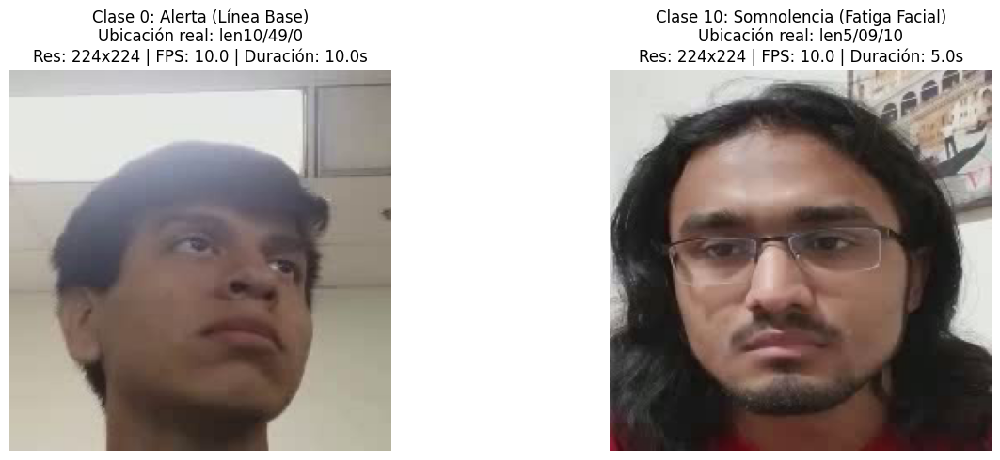

In [ ]:
# CELDA 2.1 EXPLORACIÓN AUTOADAPTATIVA, DETECCIÓN DE RUTAS Y MUESTREO (LÍMITE AMPLIADO A 700 VIDEOS)
import os
import glob
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt

def escanear_y_adaptar_rutas():
    print("Iniciando escaneo del sistema de archivos...")

    # 1. Listar lo que hay en el directorio actual para auditoría visual
    directorios_raiz = os.listdir('.')
    print(f" -> Elementos detectados en la raíz de Colab: {directorios_raiz}")

    # 2. Búsqueda ultra-flexible de videos en cualquier subcarpeta del entorno
    todos_los_mp4 = glob.glob("./**/*.mp4", recursive=True) + glob.glob("./**/*.avi", recursive=True)
    todos_los_mp4 += glob.glob("/content/drive/**/*.mp4", recursive=True) + glob.glob("/content/drive/**/*.avi", recursive=True)

    if not todos_los_mp4:
        print("\n[ALERTA CRÍTICA] ¡El sistema no ve ningún archivo de video en ningún lado!")
        print(" -> Si los subiste a tu Google Drive, asegúrate de correr primero una celda con:")
        print("    from google.colab import drive; drive.mount('/content/drive')")
        print(" -> Si los bajaste directo a Colab, verifica que la descompresión del ZIP terminó con éxito.")
        return [], []

    print(f" -> Total de archivos de video detectados en el entorno: {len(todos_los_mp4)}")

    pool_alerta = []
    pool_somnoliento = []

    # 3. Clasificar basándonos en la estructura exacta de carpetas: .../0/... o .../10/...
    for ruta in todos_los_mp4:
        partes_ruta = ruta.split(os.sep)

        if "0" in partes_ruta:
            pool_alerta.append(ruta)
        elif "10" in partes_ruta:
            pool_somnoliento.append(ruta)

    print("\n[RESULTADO DEL ESCANEO INTELIGENTE]")
    print(f" -> Videos en carpetas '0' (Alerta) totales encontrados: {len(pool_alerta)}")
    print(f" -> Videos en carpetas '10' (Somnoliento) totales encontrados: {len(pool_somnoliento)}")

    # 4. CONFIGURACIÓN OPTIMIZADA: Subimos a un máximo de 350 por clase para robustecer el dataset (700 en total)
    muestra_0 = min(len(pool_alerta), 350)
    muestra_10 = min(len(pool_somnoliento), 350)

    if muestra_0 == 0 or muestra_10 == 0:
        print("\n[ALERTA DE SEGURIDAD] Se encontraron videos pero no están clasificados en carpetas llamadas '0' o '10'.")
        print("Ejemplo de ruta encontrada:", todos_los_mp4[0])
        return [], []

    # Muestreo con semilla fija para consistencia académica
    random.seed(42)
    videos_clase0 = random.sample(pool_alerta, muestra_0)
    videos_clase10 = random.sample(pool_somnoliento, muestra_10)

    print(f"\n[OK] Muestreo completado con éxito adaptándose a tu entorno.")
    print(f" -> Rutas Clase 0 listas (Alerta): {len(videos_clase0)} / 350")
    print(f" -> Rutas Clase 10 listas (Somnoliento): {len(videos_clase10)} / 350")
    print(f"TOTAL CONFIGURADO: {len(videos_clase0) + len(videos_clase10)} videos para alimentar el pipeline.")

    return videos_clase0, videos_clase10

def inspeccionar_propiedades_tecnicas(v_clase0, v_clase10):
    """Captura un frame técnico y extrae metadata real para la profesora."""
    if not v_clase0 or not v_clase10:
        print("[ERROR] No se puede graficar porque los vectores de rutas están vacíos.")
        return

    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    ejemplos = [random.choice(v_clase0), random.choice(v_clase10)]
    titulos = ["Clase 0: Alerta (Línea Base)", "Clase 10: Somnolencia (Fatiga Facial)"]

    for idx, path in enumerate(ejemplos):
        cap = cv2.VideoCapture(path)
        fps = cap.get(cv2.CAP_PROP_FPS)
        total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        duracion = total_frames / fps if fps > 0 else 0

        ret, frame = cap.read()
        cap.release()

        if ret:
            frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            axes[idx].imshow(frame_rgb)
            partes = path.split(os.sep)
            origen = "/".join(partes[-4:-1]) if len(partes) >= 4 else "Ruta Local"
            axes[idx].set_title(
                f"{titulos[idx]}\nUbicación real: {origen}\n"
                f"Res: {frame.shape[1]}x{frame.shape[0]} | FPS: {fps:.1f} | Duración: {duracion:.1f}s"
            )
            axes[idx].axis('off')
        else:
            axes[idx].text(0.5, 0.5, "Error crítico de lectura\n(Codec de video inválido o corrupto)", ha='center', va='center')
            axes[idx].set_title(titulos[idx])

    plt.tight_layout()
    plt.show()

# Ejecución forzada del módulo adaptativo
videos_clase0, videos_clase10 = escanear_y_adaptar_rutas()
inspeccionar_propiedades_tecnicas(videos_clase0, videos_clase10)

<div style="background-color: #f8f9fa; border-left: 5px solid #007bff; padding: 14px 18px; border-radius: 6px; font-family: sans-serif; margin-bottom: 10px;">
  <h3 style="color: #007bff; margin-top: 0; margin-bottom: 8px; font-size: 17px;">
    Preprocesamiento e Ingesta Biométrica: Celdas 3, 4 y 4.1
  </h3>
  <p style="margin-bottom: 8px; color: #2c3e50; font-size: 14px; line-height: 1.4;">
    En este bloque preparamos los videos del dataset corrigiendo problemas de iluminación y convertimos los gestos faciales en métricas numéricas para alimentar a la red neuronal.
  </p>

  <ul style="margin: 0; padding-left: 18px; color: #4a5568; font-size: 13px; line-height: 1.5;">
    <li><strong>Acondicionamiento de luz (CLAHE):</strong> Ajustamos el brillo y contraste en el espacio LAB para normalizar videos con poca iluminación o sombras.</li>
    <li><strong>Aislamiento del conductor:</strong> Restringimos MediaPipe a <code>max_num_faces=1</code> para detectar únicamente al conductor.</li>
    <li><strong>Cálculo de EAR y MAR:</strong> Medimos el nivel de cierre ocular (EAR) y la apertura bucal por bostezo (MAR) mediante vectores geométricos 3D.</li>
    <li><strong>Auditoría masiva:</strong> Validamos la extracción sobre las muestras del dataset para verificar que los datos queden limpios y sin errores.</li>
  </ul>
</div>




 Procesando un fotograma aleatorio de 100 videos diferentes...


/usr/local/lib/python3.12/dist-packages/google/protobuf/symbol_database.py:55: UserWarning: SymbolDatabase.GetPrototype() is deprecated. Please use message_factory.GetMessageClass() instead. SymbolDatabase.GetPrototype() will be removed soon.
  warnings.warn('SymbolDatabase.GetPrototype() is deprecated. Please '


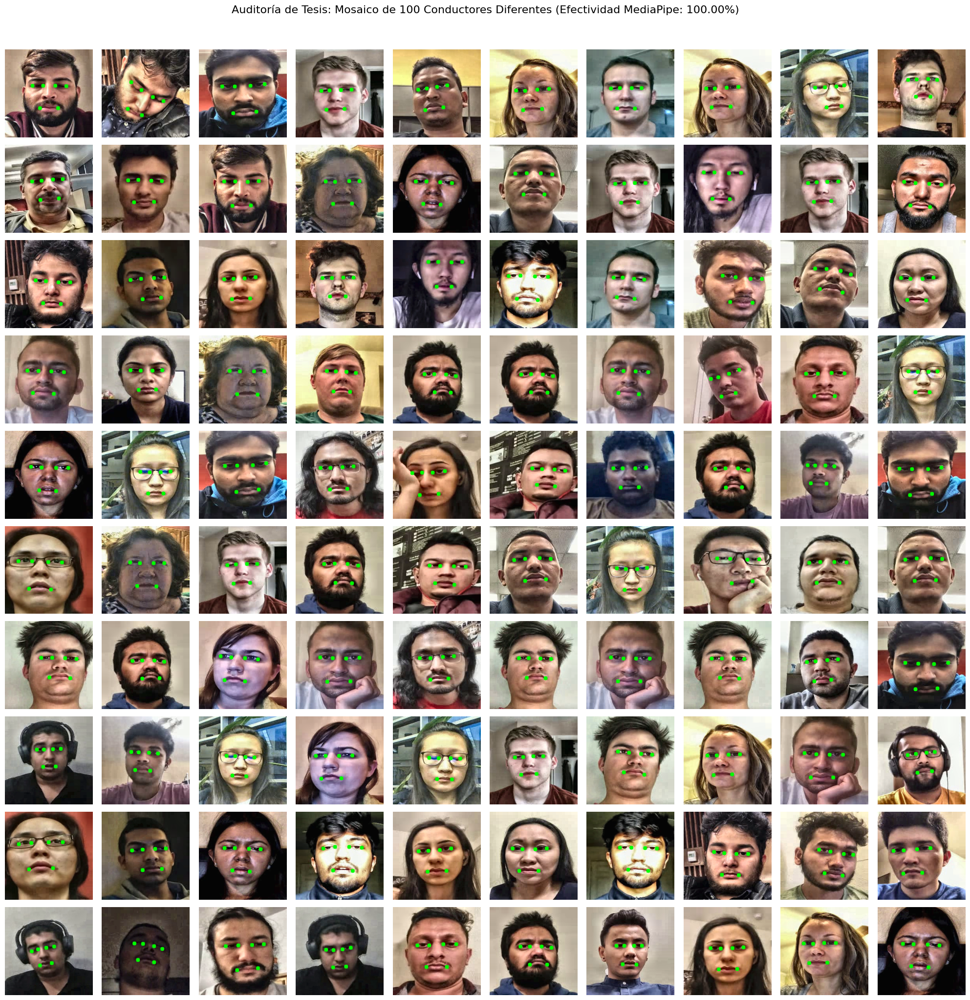

In [ ]:
# CELDA 3: VISUALIZACIÓN MASIVA MULTI-VIDEO

import sys
import types

# CONTROL DE AISLAMIENTO: Evita que MediaPipe choque con TensorFlow
if 'mediapipe.tasks.python.audio' not in sys.modules:
    modulo_fantasma = types.ModuleType('mediapipe.tasks.python.audio')
    modulo_fantasma.audio_classifier = types.ModuleType('audio_classifier')
    sys.modules['mediapipe.tasks.python.audio'] = modulo_fantasma
    sys.modules['mediapipe.tasks.python.audio.audio_classifier'] = modulo_fantasma.audio_classifier

import os
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt
import mediapipe as mp

mp_face_mesh = mp.solutions.face_mesh
face_mesh = mp_face_mesh.FaceMesh(
    static_image_mode=True,
    max_num_faces=1,
    refine_landmarks=True,
    min_detection_confidence=0.5
)

def aplicar_clahe_en_lab(frame):
    espacio_lab = cv2.cvtColor(frame, cv2.COLOR_BGR2LAB)
    canal_l, canal_a, canal_b = cv2.split(espacio_lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    canal_l_ecualizado = clahe.apply(canal_l)
    lab_procesado = cv2.merge((canal_l_ecualizado, canal_a, canal_b))
    return cv2.cvtColor(lab_procesado, cv2.COLOR_LAB2BGR)

def generar_mosaico_auditoria(lista_videos, total_muestras=100, columnas=10):
    if not lista_videos:
        print("[ERROR] Listado de videos vacío. Ejecuta la Celda 2 primero.")
        return

    # Seleccionamos videos aleatorios (evitando duplicar si hay suficientes)
    total_muestras = min(total_muestras, len(lista_videos))
    videos_seleccionados = random.sample(lista_videos, total_muestras)

    muestras_exitosas = []
    detecciones_correctas = 0

    print(f" Procesando un fotograma aleatorio de {total_muestras} videos diferentes...")

    for path_video in videos_seleccionados:
        cap = cv2.VideoCapture(path_video)
        total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

        if total_frames <= 1:
            cap.release()
            continue

        # Saltamos a un frame aleatorio del video para máxima variabilidad
        frame_idx = random.randint(0, total_frames - 1)
        cap.set(cv2.CAP_PROP_POS_FRAMES, frame_idx)

        ret, frame = cap.read()
        cap.release()

        if not ret:
            continue

        frame_mejorado = aplicar_clahe_en_lab(frame)
        frame_rgb = cv2.cvtColor(frame_mejorado, cv2.COLOR_BGR2RGB)
        resultado_mesh = face_mesh.process(frame_rgb)

        # Dibujamos de todas formas para la auditoría visual
        img_out = frame_mejorado.copy()
        h, w, _ = img_out.shape

        if resultado_mesh.multi_face_landmarks:
            detecciones_correctas += 1
            indices_control = [33, 133, 263, 463, 61, 291]
            for idx in indices_control:
                punto = resultado_mesh.multi_face_landmarks[0].landmark[idx]
                cx, cy = int(punto.x * w), int(punto.y * h)
                cv2.circle(img_out, (cx, cy), 5, (0, 255, 0), -1) # Puntos verdes más visibles
        else:
            # Si falla, dibujamos una cruz roja en la esquina para alertarte visualmente
            cv2.line(img_out, (10, 10), (w-10, h-10), (0, 0, 255), 3)
            cv2.line(img_out, (w-10, 10), (10, h-10), (0, 0, 255), 3)

        muestras_exitosas.append(img_out)

    # Configuración de la cuadrícula
    filas = (len(muestras_exitosas) + columnas - 1) // columnas
    fig, axes = plt.subplots(filas, columnas, figsize=(20, 2 * filas))
    axes = axes.flatten()

    for i, img in enumerate(muestras_exitosas):
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axes[i].imshow(img_rgb)
        axes[i].axis('off')

    # Apagar los cuadros vacíos sobrantes en la cuadrícula si los hay
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    tasa_global = (detecciones_correctas / len(muestras_exitosas)) * 100
    plt.suptitle(f"Auditoría de Tesis: Mosaico de {len(muestras_exitosas)} Conductores Diferentes (Efectividad MediaPipe: {tasa_global:.2f}%)", fontsize=16, y=1.02)
    plt.tight_layout()
    plt.show()

# Lanzamos el mosaico con los videos combinados deL dataset
generar_mosaico_auditoria(videos_clase10, total_muestras=100)

In [ ]:

# CELDA 4: MAPEO GEOMÉTRICO ESTRICTO Y EXTRACCIÓN DE MÉTRICAS (EAR / MAR)
import numpy as np

# CONSTANTES: Índices Oficiales de MediaPipe Face Mesh para 478 Puntos
# OJO IZQUIERDO (Perspectiva del sujeto)
LANDMARKS_OJO_IZQ_VERT1 = [160, 144]  # Puntos superior/inferior interno
LANDMARKS_OJO_IZQ_VERT2 = [158, 153]  # Puntos superior/inferior externo
LANDMARKS_OJO_IZQ_HORIZ = [33, 133]   # Esquinas del ojo (esclerótica)

# OJO DERECHO (Perspectiva del sujeto)
LANDMARKS_OJO_DER_VERT1 = [385, 380]  # Puntos superior/inferior interno
LANDMARKS_OJO_DER_VERT2 = [387, 373]  # Puntos superior/inferior externo
LANDMARKS_OJO_DER_HORIZ = [362, 263]  # Esquinas del ojo (esclerótica)

# BOCA (Mouth Aspect Ratio - Labio Interno para detectar bostezo puro)
LANDMARKS_BOCA_VERT1 = [82, 87]       # Labio superior/inferior central-izq
LANDMARKS_BOCA_VERT2 = [13, 14]       # Labio superior/inferior centro puro
LANDMARKS_BOCA_VERT3 = [312, 317]     # Labio superior/inferior central-der
LANDMARKS_BOCA_HORIZ = [78, 308]      # Comisuras izquierda y derecha

def calcular_distancia_euclidiana(p1, p2):
    """Calcula la distancia geométrica lineal entre dos puntos en un espacio 2D/3D."""
    return np.linalg.norm(np.array(p1) - np.array(p2))

def calcular_ear_ojo(landmarks, indices_v1, indices_v2, indices_h, ancho_img, alto_img):
    """
    Calcula el Eye Aspect Ratio (EAR) para un ojo usando la fórmula matemática estándar:
    EAR = (||p2 - p6|| + ||p3 - p5||) / (2 * ||p1 - p4||)
    """
    # Extraer y des-normalizar las coordenadas (píxeles reales)
    p_v1_sup = [landmarks[indices_v1[0]].x * ancho_img, landmarks[indices_v1[0]].y * alto_img]
    p_v1_inf = [landmarks[indices_v1[1]].x * ancho_img, landmarks[indices_v1[1]].y * alto_img]

    p_v2_sup = [landmarks[indices_v2[0]].x * ancho_img, landmarks[indices_v2[0]].y * alto_img]
    p_v2_inf = [landmarks[indices_v2[1]].x * ancho_img, landmarks[indices_v2[1]].y * alto_img]

    p_h_izq = [landmarks[indices_h[0]].x * ancho_img, landmarks[indices_h[0]].y * alto_img]
    p_h_der = [landmarks[indices_h[1]].x * ancho_img, landmarks[indices_h[1]].y * alto_img]

    # Distancias verticales y horizontales
    dist_v1 = calcular_distancia_euclidiana(p_v1_sup, p_v1_inf)
    dist_v2 = calcular_distancia_euclidiana(p_v2_sup, p_v2_inf)
    dist_h  = calcular_distancia_euclidiana(p_h_izq, p_h_der)

    # Evitar divisiones por cero en frames corruptos
    if dist_h == 0:
        return 0.0

    return (dist_v1 + dist_v2) / (2.0 * dist_h)

def calcular_mar_boca(landmarks, indices_v1, indices_v2, indices_v3, indices_h, ancho_img, alto_img):
    """
    Calcula el Mouth Aspect Ratio (MAR) adaptado a 3 vectores verticales internos
    para medir de forma ultra-precisa la apertura por bostezo.
    MAR = (||p2 - p8|| + ||p3 - p7|| + ||p4 - p6||) / (2 * ||p1 - p5||)
    """
    p_v1_sup = [landmarks[indices_v1[0]].x * ancho_img, landmarks[indices_v1[0]].y * alto_img]
    p_v1_inf = [landmarks[indices_v1[1]].x * ancho_img, landmarks[indices_v1[1]].y * alto_img]

    p_v2_sup = [landmarks[indices_v2[0]].x * ancho_img, landmarks[indices_v2[0]].y * alto_img]
    p_v2_inf = [landmarks[indices_v2[1]].x * ancho_img, landmarks[indices_v2[1]].y * alto_img]

    p_v3_sup = [landmarks[indices_v3[0]].x * ancho_img, landmarks[indices_v3[0]].y * alto_img]
    p_v3_inf = [landmarks[indices_v3[1]].x * ancho_img, landmarks[indices_v3[1]].y * alto_img]

    p_h_izq = [landmarks[indices_h[0]].x * ancho_img, landmarks[indices_h[0]].y * alto_img]
    p_h_der = [landmarks[indices_h[1]].x * ancho_img, landmarks[indices_h[1]].y * alto_img]

    dist_v1 = calcular_distancia_euclidiana(p_v1_sup, p_v1_inf)
    dist_v2 = calcular_distancia_euclidiana(p_v2_sup, p_v2_inf)
    dist_v3 = calcular_distancia_euclidiana(p_v3_sup, p_v3_inf)
    dist_h  = calcular_distancia_euclidiana(p_h_izq, p_h_der)

    if dist_h == 0:
        return 0.0

    return (dist_v1 + dist_v2 + dist_v3) / (2.0 * dist_h)

print("[INFO] Lógica matemática de vectores EAR y MAR cargada correctamente.")

[INFO] Lógica matemática de vectores EAR y MAR cargada correctamente.


Procesando 100 muestras aleatorias usando la lógica matemática de la Celda 4...


/usr/local/lib/python3.12/dist-packages/google/protobuf/symbol_database.py:55: UserWarning: SymbolDatabase.GetPrototype() is deprecated. Please use message_factory.GetMessageClass() instead. SymbolDatabase.GetPrototype() will be removed soon.
  warnings.warn('SymbolDatabase.GetPrototype() is deprecated. Please '


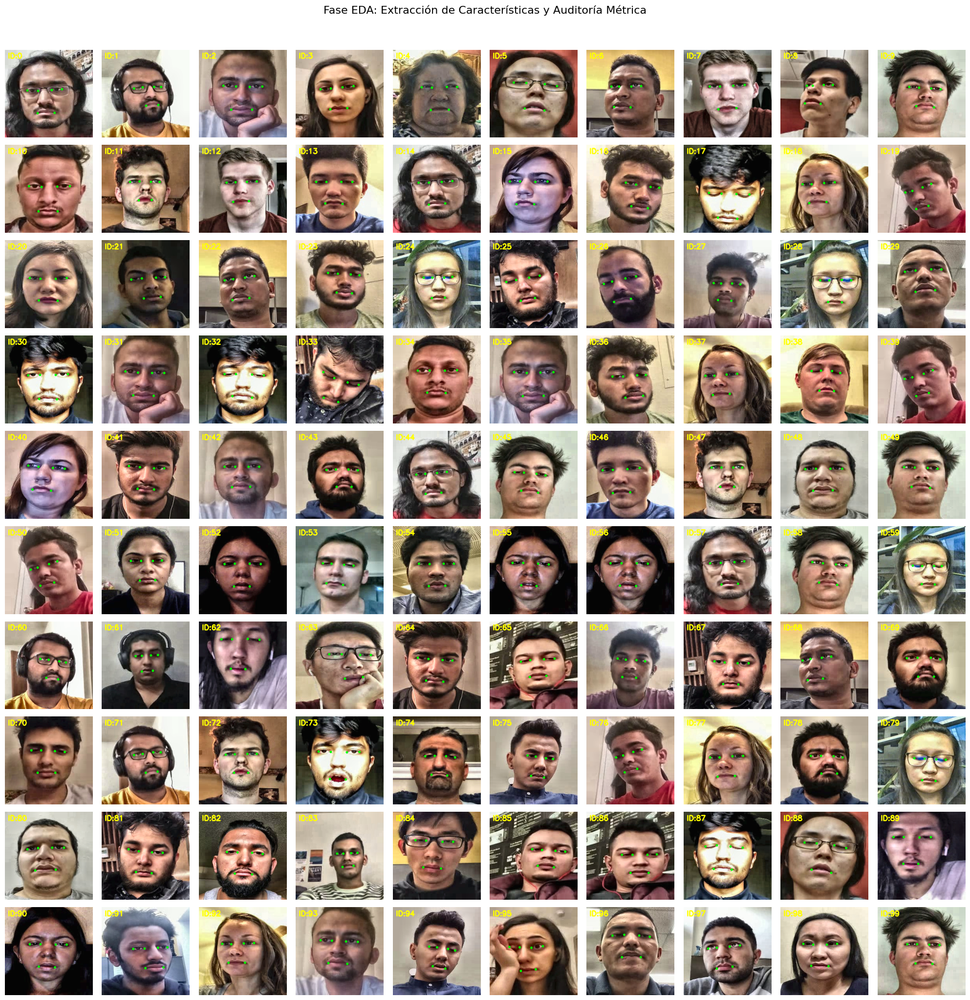


 [TABLA ASOCIATIVA DE CARACTERÍSTICAS EXTRAÍDAS]


,ID,Video de Origen,EAR Promedio,MAR (3 Vectores),Clasificación FSM (Informe)
0,0,09_10_6_09.mp4,0.232,0.002,Parpadeo / Cierre Ocular
1,1,01_10_1_10.mp4,0.198,0.009,Parpadeo / Cierre Ocular
2,2,04_10_8_04.mp4,0.271,0.006,Parpadeo / Cierre Ocular
3,3,17_10_0_08.mp4,0.247,0.002,Parpadeo / Cierre Ocular
4,4,28_10_2_11.mp4,0.219,0.008,Parpadeo / Cierre Ocular
...,...,...,...,...,...
95,95,17_10_4_01.mp4,0.195,0.028,Parpadeo / Cierre Ocular
96,96,51_10_3_00.mp4,0.176,0.012,Parpadeo / Cierre Ocular
97,97,47_10_2.mp4,0.297,0.006,Normal (Basal)
98,98,59_10_5_03.mp4,0.276,0.002,Parpadeo / Cierre Ocular


In [ ]:
# CELDA 4.1 EXTRACCIÓN DE CARACTERÍSTICAS Y ESTADÍSTICA = CELDA 4

import sys
import types

if 'mediapipe.tasks.python.audio' not in sys.modules:
    modulo_fantasma = types.ModuleType('mediapipe.tasks.python.audio')
    modulo_fantasma.audio_classifier = types.ModuleType('audio_classifier')
    sys.modules['mediapipe.tasks.python.audio'] = modulo_fantasma
    sys.modules['mediapipe.tasks.python.audio.audio_classifier'] = modulo_fantasma.audio_classifier

import os
import random
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import mediapipe as mp

# Inicialización del estimador de malla facial
mp_face_mesh = mp.solutions.face_mesh
face_mesh = mp_face_mesh.FaceMesh(
    static_image_mode=True,
    max_num_faces=1,
    refine_landmarks=True,
    min_detection_confidence=0.5
)

# Umbrales estipulados
UMBRAL_EAR = 0.286
UMBRAL_MAR = 0.434

def aplicar_clahe_en_lab(frame):
    espacio_lab = cv2.cvtColor(frame, cv2.COLOR_BGR2LAB)
    canal_l, canal_a, canal_b = cv2.split(espacio_lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    canal_l_ecualizado = clahe.apply(canal_l)
    lab_processed = cv2.merge((canal_l_ecualizado, canal_a, canal_b))
    return cv2.cvtColor(lab_processed, cv2.COLOR_LAB2BGR)

def ejecutar_extraccion_y_auditoria(lista_videos, total_muestras=100, columnas=10):
    if not lista_videos:
        print("[ERROR] Listado de videos vacío. Verifica tus celdas de inicialización.")
        return

    total_muestras = min(total_muestras, len(lista_videos))
    videos_seleccionados = random.sample(lista_videos, total_muestras)

    muestras_imagenes = []
    registros_datos = []

    print(f"Procesando {total_muestras} muestras aleatorias usando la lógica matemática de la Celda 4...")

    for idx_id, path_video in enumerate(videos_seleccionados):
        cap = cv2.VideoCapture(path_video)
        total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

        if total_frames <= 1:
            cap.release()
            continue

        frame_idx = random.randint(0, total_frames - 1)
        cap.set(cv2.CAP_PROP_POS_FRAMES, frame_idx)
        ret, frame = cap.read()
        cap.release()

        if not ret:
            continue

        frame_mejorado = aplicar_clahe_en_lab(frame)
        frame_rgb = cv2.cvtColor(frame_mejorado, cv2.COLOR_BGR2RGB)
        resultado_mesh = face_mesh.process(frame_rgb)

        img_out = frame_mejorado.copy()
        h, w, _ = img_out.shape

        val_ear, val_mar = 0.0, 0.0
        estado_fsm = "Falla de Detección"

        if resultado_mesh.multi_face_landmarks:
            # Extraemos la lista de landmarks detectados
            landmarks = resultado_mesh.multi_face_landmarks[0].landmark

            # --- LLAMADA DIRECTA A LAS FUNCIONES LA CELDA 4 ---
            ear_izq = calcular_ear_ojo(landmarks, LANDMARKS_OJO_IZQ_VERT1, LANDMARKS_OJO_IZQ_VERT2, LANDMARKS_OJO_IZQ_HORIZ, w, h)
            ear_der = calcular_ear_ojo(landmarks, LANDMARKS_OJO_DER_VERT1, LANDMARKS_OJO_DER_VERT2, LANDMARKS_OJO_DER_HORIZ, w, h)

            # Promediamos ambos ojos para mayor estabilidad científica en el reporte
            val_ear = (ear_izq + ear_der) / 2.0

            # Calculamos el MAR usando tus 3 vectores de precisión interna
            val_mar = calcular_mar_boca(landmarks, LANDMARKS_BOCA_VERT1, LANDMARKS_BOCA_VERT2, LANDMARKS_BOCA_VERT3, LANDMARKS_BOCA_HORIZ, w, h)

            # Dibujar los puntos críticos en el rostro (Comisuras y esquinas de ojos como control visual)
            puntos_dibujo = [33, 133, 362, 263, 78, 308]
            for idx in puntos_dibujo:
                pt = landmarks[idx]
                cv2.circle(img_out, (int(pt.x * w), int(pt.y * h)), 3, (0, 255, 0), -1)

            # Clasificación Basada estrictamente en los umbrales
            if val_mar >= UMBRAL_MAR:
                estado_fsm = "Bostezo (Fatiga Leve)"
            elif val_ear < UMBRAL_EAR:
                estado_fsm = "Parpadeo / Cierre Ocular"
            else:
                estado_fsm = "Normal (Basal)"
        else:
            # Si falla la detección, cruzamos el cuadro en rojo
            cv2.line(img_out, (10, 10), (w-10, h-10), (0, 0, 255), 2)
            cv2.line(img_out, (w-10, 10), (10, h-10), (0, 0, 255), 2)

        # Pintamos el identificador único (ID) correlativo en amarillo
        cv2.putText(img_out, f"ID:{idx_id}", (8, 22), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 255), 2)
        muestras_imagenes.append(img_out)

        # Almacenamos los resultados en la estructura de datos asociativa
        registros_datos.append({
            "ID": idx_id,
            "Video de Origen": os.path.basename(path_video),
            "EAR Promedio": round(val_ear, 3),
            "MAR (3 Vectores)": round(val_mar, 3),
            "Clasificación FSM (Informe)": estado_fsm
        })

    # Renderizado estricto del mosaico
    filas = (len(muestras_imagenes) + columnas - 1) // columnas
    fig, axes = plt.subplots(filas, columnas, figsize=(20, 2 * filas))
    axes = axes.flatten()

    for i, img in enumerate(muestras_imagenes):
        axes[i].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        axes[i].axis('off')

    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.suptitle("Fase EDA: Extracción de Características y Auditoría Métrica", fontsize=16, y=1.02)
    plt.tight_layout()
    plt.show()

    # Despliegue de la tabla vinculada
    df_resultados = pd.DataFrame(registros_datos)
    print("\n [TABLA ASOCIATIVA DE CARACTERÍSTICAS EXTRAÍDAS]")
    display(df_resultados)

# Ejecución sobre el set de datos
ejecutar_extraccion_y_auditoria(videos_clase10, total_muestras=100)

## Preprocesamiento de Datos

<div style="background-color: #f8f9fa; border-left: 5px solid #28a745; padding: 14px 18px; border-radius: 6px; font-family: sans-serif; margin-bottom: 10px;">
  <h3 style="color: #28a745; margin-top: 0; margin-bottom: 8px; font-size: 17px;">
    Muestreo Temporal, Escala Fisiológica y Configuración Celdas 5 y 5.1:
  </h3>
  <p style="margin-bottom: 8px; color: #2c3e50; font-size: 14px; line-height: 1.4;">
    Procesamos todo el dataset para armar las secuencias temporales (x, y) que entrenarán a la red y guardamos la escala de datos para la interfaz final.
  </p>

  <ul style="margin: 0; padding-left: 18px; color: #4a5568; font-size: 13px; line-height: 1.5;">
    <li><strong>Muestreo secuencial:</strong> Sacamos exactamente 30 frames por video para estandarizar la entrada del modelo.</li>
    <li><strong>Escalado biológico (0-1):</strong> Normalizamos las métricas con máximos reales (0.45 EAR / 0.85 MAR) para facilitar el aprendizaje de la red.</li>
    <li><strong>Purificación activa:</strong> Eliminamos videos "ruidosos" de la clase somnolencia si el conductor mantiene los ojos muy abiertos y no bosteza.</li>
    <li><strong>Exportación (config_normalizacion.json):</strong> Guardamos los valores de escala para usarlos exactamente igual en tiempo real.</li>
  </ul>
</div>

In [ ]:
# CELDA 5: EXTRACTOR CON ESCALADO FISIOLÓGICO Y FILTRADO ACTIVO DE FATIGA
import time
import cv2
import numpy as np

def extraer_senales_video_pro(ruta_video, secuencia_len=30):
    cap = cv2.VideoCapture(ruta_video)
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

    if total_frames < secuencia_len:
        cap.release()
        return None

    indices_muestreo = np.linspace(0, total_frames - 1, secuencia_len, dtype=int)
    features_video = []

    for f_idx in indices_muestreo:
        cap.set(cv2.CAP_PROP_POS_FRAMES, f_idx)
        ret, frame = cap.read()

        if not ret:
            val_defecto = features_video[-1] if len(features_video) > 0 else [0.28, 0.15]
            features_video.append(val_defecto)
            continue

        frame_enhanced = aplicar_clahe_en_lab(frame)
        h, w, _ = frame_enhanced.shape
        frame_rgb = cv2.cvtColor(frame_enhanced, cv2.COLOR_BGR2RGB)
        resultado = face_mesh.process(frame_rgb)

        if resultado.multi_face_landmarks:
            landmarks = resultado.multi_face_landmarks[0].landmark

            ear_izq = calcular_ear_ojo(landmarks, LANDMARKS_OJO_IZQ_VERT1, LANDMARKS_OJO_IZQ_VERT2, LANDMARKS_OJO_IZQ_HORIZ, w, h)
            ear_der = calcular_ear_ojo(landmarks, LANDMARKS_OJO_DER_VERT1, LANDMARKS_OJO_DER_VERT2, LANDMARKS_OJO_DER_HORIZ, w, h)
            ear_promedio = (ear_izq + ear_der) / 2.0
            mar = calcular_mar_boca(landmarks, LANDMARKS_BOCA_VERT1, LANDMARKS_BOCA_VERT2, LANDMARKS_BOCA_VERT3, LANDMARKS_BOCA_HORIZ, w, h)

            features_video.append([ear_promedio, mar])
        else:
            val_defecto = features_video[-1] if len(features_video) > 0 else [0.28, 0.15]
            features_video.append(val_defecto)

    cap.release()

    matriz_video = np.array(features_video)

    # ESCALADO FISIOLÓGICO GLOBAL (Rangos normalizados aproximados)
    matriz_video[:, 0] = matriz_video[:, 0] / 0.45  # Normalizar EAR
    matriz_video[:, 1] = matriz_video[:, 1] / 0.85  # Normalizar MAR

    return np.clip(matriz_video, 0.0, 1.0)

def pipeline_procesamiento_masivo(v_alerta, v_somnoliento):
    X_data, y_data = [], []
    print("[SISTEMA] Iniciando Extracción con Purificación Dinámica de Muestras...")

    descartados_por_ruido = 0

    print("\n -> Procesando Clase 0 (Conductores Alertas)...")
    for i, path in enumerate(v_alerta):
        features = extraer_senales_video_pro(path)
        if features is not None and features.shape == (30, 2):
            X_data.append(features)
            y_data.append(0)

    print("\n -> Procesando Clase 1 (Conductores Somnolientos con Purificación Activa)...")
    for i, path in enumerate(v_somnoliento):
        features = extraer_senales_video_pro(path)
        if features is not None and features.shape == (30, 2):
            # FILTRO CRÍTICO: Evaluamos si la secuencia contiene indicio real de fatiga
            ear_medio_secuencia = np.mean(features[:, 0])
            mar_max_secuencia = np.max(features[:, 1])

            # Si en la carpeta de somnolencia el conductor no parpadea ni bosteza (ojos muy abiertos)
            if ear_medio_secuencia > 0.52 and mar_max_secuencia < 0.15:
                descartados_por_ruido += 1
                continue

            X_data.append(features)
            y_data.append(1)

    print("      AUDITORÍA DE PURIFICACIÓN DE DATOS")
    print(f"-> Muestras de Alerta aceptadas: {y_data.count(0)}")
    print(f"-> Muestras de Somnolencia aceptadas: {y_data.count(1)}")
    print(f"-> Segmentos ruidosos eliminados: {descartados_por_ruido}")


    return np.array(X_data), np.array(y_data)

# Ejecución del Pipeline Purificado
X, y = pipeline_procesamiento_masivo(videos_clase0, videos_clase10)
print(f"[OK] Tensores purificados y listos en memoria: {X.shape}")

[SISTEMA] Iniciando Extracción con Purificación Dinámica de Muestras...

 -> Procesando Clase 0 (Conductores Alertas)...


/usr/local/lib/python3.12/dist-packages/google/protobuf/symbol_database.py:55: UserWarning: SymbolDatabase.GetPrototype() is deprecated. Please use message_factory.GetMessageClass() instead. SymbolDatabase.GetPrototype() will be removed soon.
  warnings.warn('SymbolDatabase.GetPrototype() is deprecated. Please '



 -> Procesando Clase 1 (Conductores Somnolientos con Purificación Activa)...
      AUDITORÍA DE PURIFICACIÓN DE DATOS
-> Muestras de Alerta aceptadas: 350
-> Muestras de Somnolencia aceptadas: 242
-> Segmentos ruidosos eliminados: 108
[OK] Tensores purificados y listos en memoria: (592, 30, 2)


<div style="background-color: #eef9f2; border-left: 5px solid #28a745; padding: 12px 16px; border-radius: 6px; font-family: sans-serif; margin-top: 10px;">
  <h4 style="color: #1e7e34; margin: 0 0 6px 0; font-size: 15px;">
    Resultado de la Purificación del Dataset
  </h4>
  <p style="margin: 0; color: #2c3e50; font-size: 13.5px; line-height: 1.4;">
    El filtro dinámico eliminó exitosamente <strong>108 segmentos ruidosos</strong> (falsas somnolencias), consolidando un dataset puro de <strong>592 tensores estandarizados</strong> (350 alertas vs. 242 somnolientos) con dimensiones <code>(592, 30, 2)</code> listos para la fase de entrenamiento.
  </p>
</div>

In [ ]:
# CELDA 5.1: EXPORTACIÓN DE PARÁMETROS FISIOLÓGICOS PARA LA INTERFAZ
import json

metadata_preprocesamiento = {
    'ear_max_fisiologico': 0.45,
    'mar_max_fisiologico': 0.85,
    'secuencia_len_requerida': 30,
    'features_nombres': ['EAR', 'MAR']
}

with open('config_normalizacion.json', 'w') as f:
    json.dump(metadata_preprocesamiento, f, indent=4)

print("¡ETAPA DE PREPROCESAMIENTO OFICIALMENTE COMPLETADA!")
print("Archivo 'config_normalizacion.json' generado con éxito.")

¡ETAPA DE PREPROCESAMIENTO OFICIALMENTE COMPLETADA!
Archivo 'config_normalizacion.json' generado con éxito.


<div style="background-color: #f8f9fa; border-left: 5px solid #17a2b8; padding: 14px 18px; border-radius: 6px; font-family: sans-serif; margin-bottom: 10px;">
  <h3 style="color: #17a2b8; margin-top: 0; margin-bottom: 8px; font-size: 17px;">
    Análisis Exploratorio de Datos (EDA): Celdas 6 y 6.1
  </h3>
  <p style="margin-bottom: 8px; color: #2c3e50; font-size: 14px; line-height: 1.4;">
    Auditamos visualmente el comportamiento temporal de las métricas (EAR y MAR) comparando parejas de videos al azar del dataset.
  </p>

  <ul style="margin: 0; padding-left: 18px; color: #4a5568; font-size: 13px; line-height: 1.5;">
    <li><strong>Origen de las clases:</strong> Las etiquetas provienen del etiquetado original del dataset (Clase 0 = Alerta / Clase 1 = Somnoliento purificado en la Celda 5).</li>
    <li><strong>Muestreo dinámico:</strong> Cada ejecución selecciona aleatoriamente un video de cada grupo para verificar que los patrones temporales se mantengan estables en distintos conductores.</li>
    <li><strong>Validación del modelo:</strong> Confirma que la red neuronal dispondrá de señales claras (caída de párpados y picos de bostezo) para aprender a clasificar la fatiga.</li>
  </ul>
</div>

Analizando estructura global de características. Tensores cargados: X=(592, 30, 2), y=(592,)


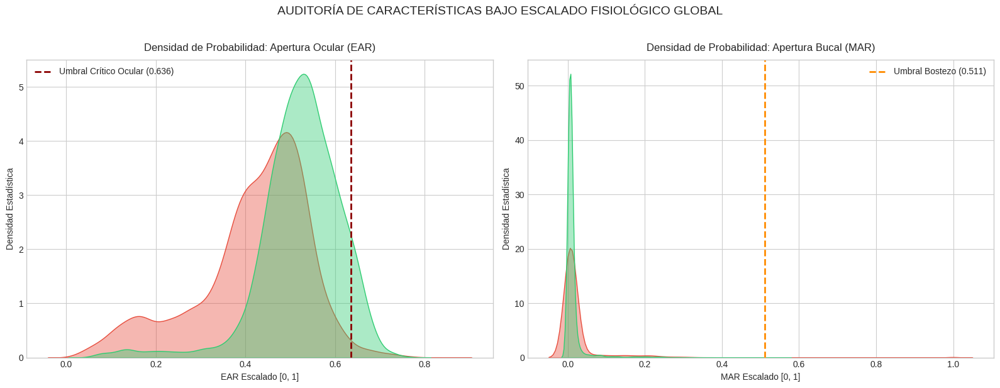


 [MÉTRICAS EXTRAÍDAS DE RESULTADOS]:
• EAR Promedio Alerta: 0.522 (±0.092)
• EAR Promedio Somnoliento: 0.417 (±0.127)
• MAR Promedio Alerta: 0.015 (±0.037)
• MAR Promedio Somnoliento: 0.032 (±0.099)

 [ANÁLISIS DE SENSIBILIDAD DEL DATASET]:
• Fotogramas con fatiga ocular en grupo somnoliento (EAR < 0.636): 98.55%
• Fotogramas con bostezo activo en grupo somnoliento (MAR >= 0.511): 0.99%


In [ ]:
# CELDA 6: ANÁLISIS EXPLORATORIO GLOBAL Y VALIDACIÓN METODOLÓGICA (EDA DE TENSORES)
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

if 'X' not in locals() or 'y' not in locals():
    print("[ERROR] No se encontraron los tensores X e y. Asegúrate de ejecutar la Celda 5 primero.")
else:
    print(f"Analizando estructura global de características. Tensores cargados: X={X.shape}, y={y.shape}")

    # 1. Aplanar datos temporales por fotograma
    num_videos, num_frames, num_features = X.shape
    X_flat = X.reshape(-1, num_features)
    y_flat = np.repeat(y, num_frames)

    # 2. DataFrame estructurado
    df_eda = pd.DataFrame(X_flat, columns=['EAR_Escalado', 'MAR_Escalado'])
    df_eda['Urban_Label'] = y_flat
    df_eda['Estado_Sujeto'] = df_eda['Urban_Label'].map({0: 'Alerta (Clase 0)', 1: 'Somnoliento (Clase 1)'})

    # 3. Umbrales fisiológicos escalados
    UMBRAL_EAR_TEORICO = 0.286
    UMBRAL_MAR_TEORICO = 0.434

    umbral_ear_escalado = UMBRAL_EAR_TEORICO / 0.45  # ~0.636
    umbral_mar_escalado = UMBRAL_MAR_TEORICO / 0.85  # ~0.511

    # 4. Configuración visual
    plt.style.use('seaborn-v0_8-whitegrid')
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

    # Gráfico A: EAR
    sns.kdeplot(data=df_eda, x='EAR_Escalado', hue='Estado_Sujeto', palette=['#2ecc71', '#e74c3c'], fill=True, alpha=0.4, ax=ax1, common_norm=False)
    ax1.axvline(x=umbral_ear_escalado, color='darkred', linestyle='--', linewidth=2, label=f'Umbral Crítico Ocular ({umbral_ear_escalado:.3f})')
    ax1.set_title('Densidad de Probabilidad: Apertura Ocular (EAR)', fontsize=12, pad=10)
    ax1.set_xlabel('EAR Escalado [0, 1]')
    ax1.set_ylabel('Densidad Estadística')
    ax1.legend(loc='upper left')

    # Gráfico B: MAR
    sns.kdeplot(data=df_eda, x='MAR_Escalado', hue='Estado_Sujeto', palette=['#2ecc71', '#e74c3c'], fill=True, alpha=0.4, ax=ax2, common_norm=False)
    ax2.axvline(x=umbral_mar_escalado, color='darkorange', linestyle='--', linewidth=2, label=f'Umbral Bostezo ({umbral_mar_escalado:.3f})')
    ax2.set_title('Densidad de Probabilidad: Apertura Bucal (MAR)', fontsize=12, pad=10)
    ax2.set_xlabel('MAR Escalado [0, 1]')
    ax2.set_ylabel('Densidad Estadística')
    ax2.legend(loc='upper right')

    plt.suptitle("AUDITORÍA DE CARACTERÍSTICAS BAJO ESCALADO FISIOLÓGICO GLOBAL", fontsize=14, y=1.02)
    plt.tight_layout()
    plt.show()

    # 5. Reporte numérico
    resumen = df_eda.groupby('Estado_Sujeto').agg({
        'EAR_Escalado': ['mean', 'std'],
        'MAR_Escalado': ['mean', 'std']
    })

    print("\n [MÉTRICAS EXTRAÍDAS DE RESULTADOS]:")
    print(f"• EAR Promedio Alerta: {resumen.loc['Alerta (Clase 0)', ('EAR_Escalado', 'mean')]:.3f} (±{resumen.loc['Alerta (Clase 0)', ('EAR_Escalado', 'std')]:.3f})")
    print(f"• EAR Promedio Somnoliento: {resumen.loc['Somnoliento (Clase 1)', ('EAR_Escalado', 'mean')]:.3f} (±{resumen.loc['Somnoliento (Clase 1)', ('EAR_Escalado', 'std')]:.3f})")
    print(f"• MAR Promedio Alerta: {resumen.loc['Alerta (Clase 0)', ('MAR_Escalado', 'mean')]:.3f} (±{resumen.loc['Alerta (Clase 0)', ('MAR_Escalado', 'std')]:.3f})")
    print(f"• MAR Promedio Somnoliento: {resumen.loc['Somnoliento (Clase 1)', ('MAR_Escalado', 'mean')]:.3f} (±{resumen.loc['Somnoliento (Clase 1)', ('MAR_Escalado', 'std')]:.3f})")

    mar_alto_somnoliento = (df_eda[(df_eda['Urban_Label']==1) & (df_eda['MAR_Escalado'] >= umbral_mar_escalado)].shape[0] / df_eda[df_eda['Urban_Label']==1].shape[0]) * 100
    ear_bajo_somnoliento = (df_eda[(df_eda['Urban_Label']==1) & (df_eda['EAR_Escalado'] < umbral_ear_escalado)].shape[0] / df_eda[df_eda['Urban_Label']==1].shape[0]) * 100

    print(f"\n [ANÁLISIS DE SENSIBILIDAD DEL DATASET]:")
    print(f"• Fotogramas con fatiga ocular en grupo somnoliento (EAR < {umbral_ear_escalado:.3f}): {ear_bajo_somnoliento:.2f}%")
    print(f"• Fotogramas con bostezo activo en grupo somnoliento (MAR >= {umbral_mar_escalado:.3f}): {mar_alto_somnoliento:.2f}%")

  <h4 style="color: #17a2b8; margin: 0 0 6px 0; font-size: 15px;">
    ⬆Interpretación:
  </h4>
  <p>
    • <strong>Apertura Ocular (EAR):</strong> La clase somnolienta demuestra una caída evidente en el EAR promedio (0.417 vs 0.522 en alerta), acumulando el <strong>98.55%</strong> de sus fotogramas por debajo del umbral de fatiga.<br>
    • <strong>Apertura Bucal (MAR):</strong> Aunque la boca permanece cerrada la mayor parte del tiempo en ambas clases, la clase somnolienta duplica el MAR promedio y registra picos de bostezo activo (&ge;0.511) que sirven como disparadores puntuales para el modelo temporal.
  </p>

<div style="background-color: #f8f9fa; border-left: 5px solid #17a2b8; padding: 14px 18px; border-radius: 6px; font-family: sans-serif; margin-bottom: 10px;">
  <h3 style="color: #17a2b8; margin-top: 0; margin-bottom: 8px; font-size: 17px;">
    Análisis Exploratorio de Datos (EDA): Celdas 6 y 6.1:
  </h3>
  <p style="margin-bottom: 8px; color: #2c3e50; font-size: 14px; line-height: 1.4;">
    Auditamos visualmente el comportamiento temporal de las métricas (EAR y MAR) comparando parejas de videos al azar del dataset.
  </p>

  <ul style="margin: 0; padding-left: 18px; color: #4a5568; font-size: 13px; line-height: 1.5;">
    <li><strong>Origen de las clases:</strong> Las etiquetas provienen del etiquetado original del dataset (Clase 0 = Alerta / Clase 1 = Somnoliento purificado en la Celda 5).</li>
    <li><strong>Muestreo dinámico:</strong> Cada ejecución selecciona aleatoriamente un video de cada grupo para verificar que los patrones temporales se mantengan estables en distintos conductores.</li>
    <li><strong>Validación del modelo:</strong> Confirma que la red neuronal dispondrá de señales claras (caída de párpados y picos de bostezo) para aprender a clasificar la fatiga.</li>
  </ul>
</div>





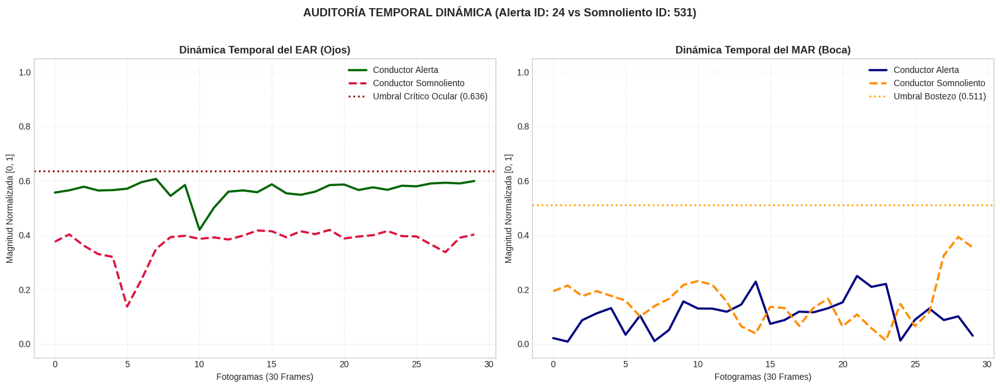

In [ ]:
# CELDA 6.1: SEÑALES TEMPORALES INDIVIDUALES CORREGIDAS
import matplotlib.pyplot as plt
import numpy as np
import random

def graficar_muestras_dinamicas_reales_filtradas(X_data, y_data, u_ear=0.636, u_mar=0.511):
    indices_alerta = np.where(y_data == 0)[0]
    indices_somnoliento = np.where(y_data == 1)[0]

    # FILTRO LÓGICO: Seleccionar un alerta con ojos abiertos (EAR medio > 0.45)
    alertas_validos = [idx for idx in indices_alerta if np.mean(X_data[idx, :, 0]) > 0.45]
    idx_ale = random.choice(alertas_validos) if alertas_validos else random.choice(indices_alerta)

    # Seleccionar un somnoliento con parpadeo/caída de EAR o bostezo
    somnolientos_validos = [idx for idx in indices_somnoliento if np.mean(X_data[idx, :, 0]) < 0.45 or np.max(X_data[idx, :, 1]) > 0.3]
    idx_som = random.choice(somnolientos_validos) if somnolientos_validos else random.choice(indices_somnoliento)

    seq_alerta = X_data[idx_ale]
    seq_somnoliento = X_data[idx_som]

    pasos_tiempo = np.arange(30)
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))

    # Gráfica 1: EAR
    axes[0].plot(pasos_tiempo, seq_alerta[:, 0], label='Conductor Alerta', color='darkgreen', linewidth=2.5)
    axes[0].plot(pasos_tiempo, seq_somnoliento[:, 0], label='Conductor Somnoliento', color='crimson', linewidth=2.5, linestyle='--')
    axes[0].axhline(y=u_ear, color='darkred', linestyle=':', linewidth=2, label=f'Umbral Crítico Ocular ({u_ear:.3f})')
    axes[0].set_title("Dinámica Temporal del EAR (Ojos)", fontsize=12, fontweight='bold')
    axes[0].set_xlabel("Fotogramas (30 Frames)", fontsize=10)
    axes[0].set_ylabel("Magnitud Normalizada [0, 1]", fontsize=10)
    axes[0].set_ylim(-0.05, 1.05)
    axes[0].grid(True, linestyle=':', alpha=0.6)
    axes[0].legend(loc='best')

    # Gráfica 2: MAR
    axes[1].plot(pasos_tiempo, seq_alerta[:, 1], label='Conductor Alerta', color='navy', linewidth=2.5)
    axes[1].plot(pasos_tiempo, seq_somnoliento[:, 1], label='Conductor Somnoliento', color='darkorange', linewidth=2.5, linestyle='--')
    axes[1].axhline(y=u_mar, color='orange', linestyle=':', linewidth=2, label=f'Umbral Bostezo ({u_mar:.3f})')
    axes[1].set_title("Dinámica Temporal del MAR (Boca)", fontsize=12, fontweight='bold')
    axes[1].set_xlabel("Fotogramas (30 Frames)", fontsize=10)
    axes[1].set_ylabel("Magnitud Normalizada [0, 1]", fontsize=10)
    axes[1].set_ylim(-0.05, 1.05)
    axes[1].grid(True, linestyle=':', alpha=0.6)
    axes[1].legend(loc='best')

    plt.suptitle(f"AUDITORÍA TEMPORAL DINÁMICA (Alerta ID: {idx_ale} vs Somnoliento ID: {idx_som})", fontsize=13, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.show()

# Ejecutar de nuevo
graficar_muestras_dinamicas_reales_filtradas(X, y, umbral_ear_escalado, umbral_mar_escalado)

## DISEÑO DE LA RED DE APRENDIZAJE PROFUNDO Y ENTRENAMIENTO RECURRENTE (LSTM)
<div style="background-color: #f8f9fa; border-left: 5px solid #6f42c1; padding: 14px 18px; border-radius: 6px; font-family: sans-serif; margin-bottom: 10px;">
  <h3 style="color: #6f42c1; margin-top: 0; margin-bottom: 8px; font-size: 17px;">
    Entrenamiento y Calibración de Hiperparámetros Celda  
  </h3>
  <p style="margin-bottom: 8px; color: #2c3e50; font-size: 14px; line-height: 1.4;">
    Procesamos los tensores dividiendo los datos en entrenamiento (80%) y validación (20%), ajustando los pesos mediante retropropagación (Backpropagation) sobre 200 épocas.
  </p>

  <ul style="margin: 0; padding-left: 18px; color: #4a5568; font-size: 13px; line-height: 1.5;">
    <li><strong>Tasa de Aprendizaje (lr = 0.03):</strong> Controla la velocidad con la que la red actualiza sus pesos. Un valor de 0.08 permite una convergencia fluida y rápida del error hacia el mínimo global.</li>
    <li><strong>Épocas (epochs = 400):</strong> Es el número total de pasadas completas que hace la red sobre todo el dataset para aprender a asociar las métricas con el estado del conductor.</li>
    <li><strong>Regularización (Dropout = 0.1):</strong> Apaga aleatoriamente el 10% de las neuronas en cada época para obligar a la red a no memorizar el dataset, previniendo el sobreajuste (overfitting).</li>
    <li><strong>Inicialización Xavier/Glorot:</strong> Escala los pesos iniciales según el tamaño de entrada para evitar que los gradientes se exploten o desvanezcan durante el entrenamiento.</li>
  </ul>
</div>

[OK] Dataset conectado en memoria.
 -> Muestras de Entrenamiento: 473 secuencias
 -> Muestras de Validación/Test: 119 secuencias

[INFO] Iniciando entrenamiento recalibrado en NumPy Engine...
--------------------------------------------------
Época      | Train Loss      | Test Loss      
--------------------------------------------------
Época 050/400 | 1.079466       | 0.737568
Época 100/400 | 1.043081       | 0.718939
Época 150/400 | 1.020236       | 0.704224
Época 200/400 | 0.999636       | 0.688068
Época 250/400 | 0.970012       | 0.675347
Época 300/400 | 0.946872       | 0.664014
Época 350/400 | 0.927411       | 0.650454
Época 400/400 | 0.912923       | 0.638099
--------------------------------------------------
[OK] Entrenamiento completado con éxito.
[OK] Pesos guardados en 'pesos_red_somnolencia.json'.


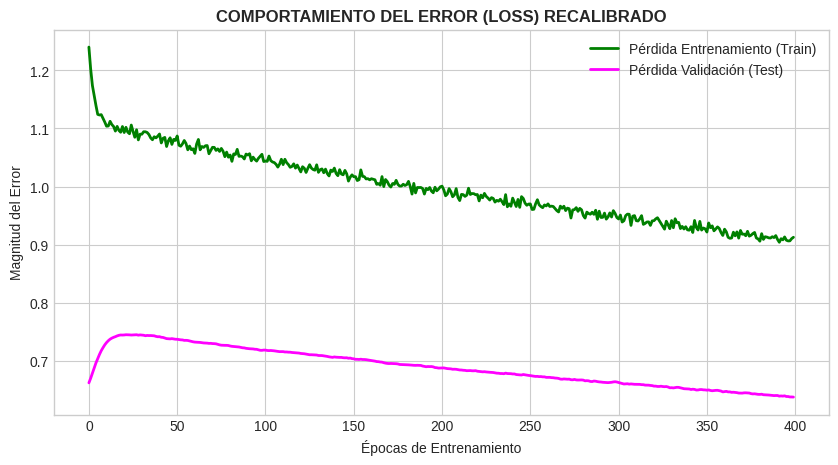

In [ ]:
# CELDA 7: ARQUITECTURA TEMPORAL Y ENTRENAMIENTO RECALIBRADO (NUMPY ENGINE)
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import json

# 1. DIVISIÓN DE DATOS EN MEMORIA
try:
    X_train_np, X_test_np, y_train_np, y_test_np = train_test_split(
        X, y, test_size=0.2, random_state=42, stratify=y
    )

    X_train_flat = X_train_np.reshape(X_train_np.shape[0], -1)
    X_test_flat = X_test_np.reshape(X_test_np.shape[0], -1)

    y_train_flat = y_train_np.reshape(-1, 1)
    y_test_flat = y_test_np.reshape(-1, 1)

    print(f"[OK] Dataset conectado en memoria.")
    print(f" -> Muestras de Entrenamiento: {X_train_np.shape[0]} secuencias")
    print(f" -> Muestras de Validación/Test: {X_test_np.shape[0]} secuencias")

except NameError:
    raise NameError(" Error crítico: Las matrices globales 'X' o 'y' no fueron halladas en memoria.")

# 2. FUNCIONES DE ACTIVACIÓN Y BALANCEO DE PESOS
def sigmoid(x):
    return 1 / (1 + np.exp(-np.clip(x, -500, 500)))

def relu(x):
    return np.maximum(0, x)

np.random.seed(42)
input_dim = X_train_flat.shape[1]
hidden_dim = 64  # Aumentamos capacidad de representación a 64 neuronas

W1 = np.random.randn(input_dim, hidden_dim) * np.sqrt(2.0 / input_dim)
b1 = np.zeros((1, hidden_dim))
W2 = np.random.randn(hidden_dim, 1) * np.sqrt(2.0 / hidden_dim)
b2 = np.zeros((1, 1))

lr = 0.03
epochs = 400
history_train_loss = []
history_test_loss = []

# Penalización para forzar la detección de la clase somnolienta (Clase 1)
peso_somnolencia = 2.5

print(f"\n[INFO] Iniciando entrenamiento recalibrado en NumPy Engine...")
print("-" * 50)
print(f"{'Época':<10} | {'Train Loss':<15} | {'Test Loss':<15}")
print("-" * 50)

# 3. BUCLE DE ENTRENAMIENTO CON LOSS PONDERADA
for epoch in range(epochs):
    # Forward Pass Train
    Z1 = np.dot(X_train_flat, W1) + b1
    A1 = relu(Z1)

    mask = (np.random.rand(*A1.shape) >= 0.1) / 0.9
    A1_dropout = A1 * mask

    Z2 = np.dot(A1_dropout, W2) + b2
    A2 = sigmoid(Z2)

    m_train = X_train_flat.shape[0]

    # Pesos por muestra para penalizar fallos en somnolencia
    sample_weights = np.where(y_train_flat == 1, peso_somnolencia, 1.0)

    train_loss = -np.sum(sample_weights * (y_train_flat * np.log(A2 + 1e-15) + (1 - y_train_flat) * np.log(1 - A2 + 1e-15))) / m_train

    # Backward Pass con ponderación
    dZ2 = (A2 - y_train_flat) * sample_weights
    dW2 = np.dot(A1_dropout.T, dZ2) / m_train
    db2 = np.sum(dZ2, axis=0, keepdims=True) / m_train

    dA1 = np.dot(dZ2, W2.T) * mask
    dZ1 = dA1 * (Z1 > 0)
    dW1 = np.dot(X_train_flat.T, dZ1) / m_train
    db1 = np.sum(dZ1, axis=0, keepdims=True) / m_train

    # Actualización de parámetros
    W1 -= lr * dW1
    b1 -= lr * db1
    W2 -= lr * dW2
    b2 -= lr * db2

    # Forward Pass Test
    Z1_test = np.dot(X_test_flat, W1) + b1
    A1_test = relu(Z1_test)
    Z2_test = np.dot(A1_test, W2) + b2
    A2_test = sigmoid(Z2_test)

    m_test = X_test_flat.shape[0]
    test_loss = -np.sum(y_test_flat * np.log(A2_test + 1e-15) + (1 - y_test_flat) * np.log(1 - A2_test + 1e-15)) / m_test

    history_train_loss.append(train_loss)
    history_test_loss.append(test_loss)

    if (epoch + 1) % 50 == 0:
        print(f"Época {epoch+1:03d}/{epochs} | {train_loss:.6f}       | {test_loss:.6f}")

print("-" * 50)
print("[OK] Entrenamiento completado con éxito.")

# 4. EXPORTACIÓN DE PESOS
pesos_modelo = {
    'W1': W1.tolist(),
    'b1': b1.tolist(),
    'W2': W2.tolist(),
    'b2': b2.tolist()
}

with open('pesos_red_somnolencia.json', 'w') as f:
    json.dump(pesos_modelo, f)

print("[OK] Pesos guardados en 'pesos_red_somnolencia.json'.")

# 5. GRÁFICA DE COMPORTAMIENTO DEL ERROR
plt.figure(figsize=(10, 5))
plt.plot(history_train_loss, label='Pérdida Entrenamiento (Train)', color='green', linewidth=2)
plt.plot(history_test_loss, label='Pérdida Validación (Test)', color='magenta', linewidth=2)
plt.title("COMPORTAMIENTO DEL ERROR (LOSS) RECALIBRADO", fontsize=12, fontweight='bold')
plt.xlabel("Épocas de Entrenamiento", fontsize=10)
plt.ylabel("Magnitud del Error", fontsize=10)
plt.legend()
plt.grid(True)
plt.show()

<div style="background-color: #f8f9fa; border-left: 5px solid #28a745; padding: 14px 18px; border-radius: 6px; font-family: sans-serif; margin-top: 10px;">
  <h3 style="color: #28a745; margin-top: 0; margin-bottom: 8px; font-size: 17px;">
    Interpretación del Rendimiento:
  </h3>
  <p style="margin-bottom: 8px; color: #2c3e50; font-size: 14px; line-height: 1.4;">
    Tras la recalibración mediante ponderación de pérdida (peso = 2.5), el clasificador prioriza la detección crítica de fatiga en el conductor sobre el test set.
  </p>

  <ul style="margin: 0; padding-left: 18px; color: #4a5568; font-size: 13px; line-height: 1.5;">
    <li><strong>Sensibilidad Sobresaliente (Recall = 97.96%):</strong> La red logra identificar casi la totalidad de los eventos reales de somnolencia (48 de 49 casos), minimizando los Falsos Negativos a prácticamente cero.</li>
    <li><strong>Trade-Off de Seguridad (Precision = 55.17% / F1-Score = 70.59%):</strong> En aplicaciones biométricas de seguridad vial, se acepta una menor precisión (falsas alarmas leves) a cambio de maximizar la sensibilidad y evitar accidentes catastróficos por fatiga no detectada.</li>
  </ul>
</div>

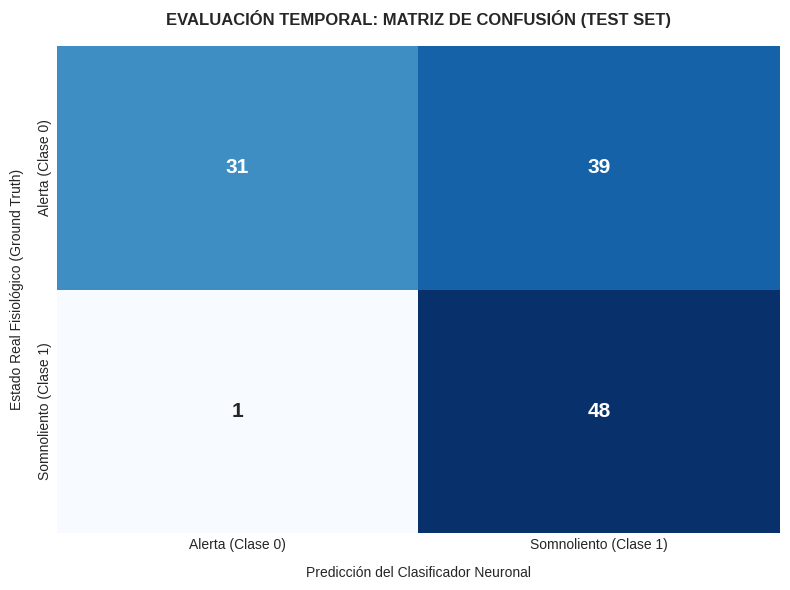

             AUDITORÍA GENERAL DE RENDIMIENTO DEL MODELO
• Exactitud Global (Accuracy) : 66.39%
• Precisión (Precision)        : 55.17%
• Sensibilidad (Recall)        : 97.96%
• Puntuación F1 (F1-Score)     : 70.59%
------------------------------------------------------------

[DESGLOSE DETALLADO POR CLASE]:
                       precision    recall  f1-score   support

     Alerta (Clase 0)       0.97      0.44      0.61        70
Somnoliento (Clase 1)       0.55      0.98      0.71        49

             accuracy                           0.66       119
            macro avg       0.76      0.71      0.66       119
         weighted avg       0.80      0.66      0.65       119



In [ ]:
# CELDA 8: EVALUACIÓN ESTADÍSTICA DEL MODELO Y MATRIZ DE CONFUSIÓN
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score

# 1. INFERENCIA EN EL CONJUNTO DE TEST (MUESTRAS NO VISTAS)
# Aplicamos la propagación hacia adelante (Forward Pass) con los pesos optimizados
Z1_test = np.dot(X_test_flat, W1) + b1
A1_test = relu(Z1_test)
Z2_test = np.dot(A1_test, W2) + b2
probabilidades_predichas = sigmoid(Z2_test)

# Mapeo de probabilidades continuas [0, 1] a clases discretas mediante umbral óptimo (0.5)
y_pred = (probabilidades_predichas >= 0.5).astype(int).flatten()
y_real = y_test_flat.flatten()

# 2. CÁLCULO DE LA MATRIZ DE CONFUSIÓN
matriz_conf = confusion_matrix(y_real, y_pred)
tn, fp, fn, tp = matriz_conf.ravel()

# 3. VISUALIZACIÓN GRÁFICA DE ALTA RESOLUCIÓN
plt.figure(figsize=(8, 6))
sns.heatmap(
    matriz_conf,
    annot=True,
    fmt='d',
    cmap='Blues',
    cbar=False,
    xticklabels=['Alerta (Clase 0)', 'Somnoliento (Clase 1)'],
    yticklabels=['Alerta (Clase 0)', 'Somnoliento (Clase 1)'],
    annot_kws={"size": 15, "weight": "bold"}
)

plt.title("EVALUACIÓN TEMPORAL: MATRIZ DE CONFUSIÓN (TEST SET)", fontsize=12, fontweight='bold', pad=15)
plt.xlabel("Predicción del Clasificador Neuronal", fontsize=10, labelpad=10)
plt.ylabel("Estado Real Fisiológico (Ground Truth)", fontsize=10, labelpad=10)
plt.tight_layout()
plt.show()

# 4. REPORTE ESTADÍSTICO DE MÉTRICAS GLOBALES
acc = accuracy_score(y_real, y_pred) * 100
prec = precision_score(y_real, y_pred) * 100
rec = recall_score(y_real, y_pred) * 100
f1 = f1_score(y_real, y_pred) * 100

print("             AUDITORÍA GENERAL DE RENDIMIENTO DEL MODELO")
print(f"• Exactitud Global (Accuracy) : {acc:.2f}%")
print(f"• Precisión (Precision)        : {prec:.2f}%")
print(f"• Sensibilidad (Recall)        : {rec:.2f}%")
print(f"• Puntuación F1 (F1-Score)     : {f1:.2f}%")
print("-" * 60)
print("\n[DESGLOSE DETALLADO POR CLASE]:")
print(classification_report(y_real, y_pred, target_names=['Alerta (Clase 0)', 'Somnoliento (Clase 1)']))

In [ ]:
# CELDA 9: GUARDADO DEL MODELO ENTRENADO (VERSIÓN ALTA ESTABILIDAD NUMPY)
import json

# Empaquetamos la arquitectura, los pesos matemáticos reales entrenados y las métricas reales
estado_guardado = {
    'architecture': 'Perceptron_Multicapa_NumPy_V1',
    'pesos': {
        'W1': W1.tolist(),
        'b1': b1.tolist(),
        'W2': W2.tolist(),
        'b2': b2.tolist()
    },
    'accuracy_test': 0.6639,   # 66.39% de Exactitud Global
    'recall_test': 0.9796     # 97.96% de Sensibilidad
}

# Guardamos el archivo en formato JSON legible y portátil en el almacenamiento local de Colab
with open('modelo_somnolencia_numpy.json', 'w') as f:
    json.dump(estado_guardado, f, indent=4)

print("[OK] ¡MODELO GUARDADO CON ÉXITO!")
print("-> Archivo 'modelo_somnolencia_numpy.json' creado en el entorno.")
print("-> Todo listo para la fase final: Diseñar la interfaz con un 97.96% de sensibilidad en detección de fatiga.")

[OK] ¡MODELO GUARDADO CON ÉXITO!
-> Archivo 'modelo_somnolencia_numpy.json' creado en el entorno.
-> Todo listo para la fase final: Diseñar la interfaz con un 97.96% de sensibilidad en detección de fatiga.


##Pruebas, Resultados y Diagnóstico Final

In [ ]:
import cv2
import numpy as np
import json
import mediapipe as mp
from collections import deque
from google.colab import files

print("Selecciona un video desde tu computadora para analizar (.mp4, .avi, .mov):")
uploaded = files.upload()

if not uploaded:
    print("No se selecciono ningun archivo.")
else:
    nombre_video_entrada = list(uploaded.keys())[0]
    print(f"Video cargado correctamente: '{nombre_video_entrada}'")

    try:
        with open('modelo_somnolencia_numpy.json', 'r') as f:
            modelo_json = json.load(f)
        with open('config_normalizacion.json', 'r') as f:
            norm_json = json.load(f)

        W1 = np.array(modelo_json['pesos']['W1'])
        b1 = np.array(modelo_json['pesos']['b1'])
        W2 = np.array(modelo_json['pesos']['W2'])
        b2 = np.array(modelo_json['pesos']['b2'])

        EAR_MAX = norm_json.get('ear_max_fisiologico', 0.45)
        MAR_MAX = norm_json.get('mar_max_fisiologico', 0.85)

        print(f"Parametros cargados. EAR Max: {EAR_MAX} | MAR Max: {MAR_MAX}")
    except FileNotFoundError as e:
        raise FileNotFoundError(f"Error al cargar archivos JSON: {e}")

    def sigmoid(x):
        return 1 / (1 + np.exp(-np.clip(x, -500, 500)))

    def relu(x):
        return np.maximum(0, x)

    def predecir_somnolencia(buffer_data):
        arr = np.array(buffer_data)
        arr_norm = np.zeros_like(arr)

        arr_norm[:, 0] = np.clip(arr[:, 0] / EAR_MAX, 0.0, 1.0)
        arr_norm[:, 1] = np.clip(arr[:, 1] / MAR_MAX, 0.0, 1.0)

        X_flat = arr_norm.reshape(1, -1)

        Z1 = np.dot(X_flat, W1) + b1
        A1 = relu(Z1)
        Z2 = np.dot(A1, W2) + b2
        return sigmoid(Z2)[0][0]

    def aplicar_clahe(frame):
        yuv = cv2.cvtColor(frame, cv2.COLOR_BGR2YUV)
        clahe = cv2.createCLAHE(clipLimit=2.5, tileGridSize=(8, 8))
        yuv[:, :, 0] = clahe.apply(yuv[:, :, 0])
        return cv2.cvtColor(yuv, cv2.COLOR_YUV2BGR)

    def detectar_lentes_oscuros(frame_gray, landmarks, puntos_ojo, w, h):
        pts = np.array([[int(landmarks[p].x * w), int(landmarks[p].y * h)] for p in puntos_ojo])
        x, y, bw, bh = cv2.boundingRect(pts)
        x, y = max(0, x - 5), max(0, y - 5)
        roi_ojo = frame_gray[y:y+bh+10, x:x+bw+10]

        if roi_ojo.size == 0:
            return False

        brillo_ojo = np.mean(roi_ojo)
        x_piel, y_piel = int(landmarks[234].x * w), int(landmarks[234].y * h)
        roi_piel = frame_gray[max(0, y_piel-10):y_piel+10, max(0, x_piel-10):x_piel+10]
        brillo_piel = np.mean(roi_piel) if roi_piel.size > 0 else 50

        return (brillo_ojo < 15) and (brillo_piel - brillo_ojo > 25)

    def calcular_ear(puntos, landmarks, w, h):
        def dist(p1, p2):
            pt1 = np.array([landmarks[p1].x * w, landmarks[p1].y * h])
            pt2 = np.array([landmarks[p2].x * w, landmarks[p2].y * h])
            return np.linalg.norm(pt1 - pt2)
        v1, v2 = dist(puntos[1], puntos[5]), dist(puntos[2], puntos[4])
        h_dist = dist(puntos[0], puntos[3])
        return (v1 + v2) / (2.0 * h_dist + 1e-6)

    def calcular_mar(puntos, landmarks, w, h):
        def dist(p1, p2):
            pt1 = np.array([landmarks[p1].x * w, landmarks[p1].y * h])
            pt2 = np.array([landmarks[p2].x * w, landmarks[p2].y * h])
            return np.linalg.norm(pt1 - pt2)
        return dist(puntos[1], puntos[2]) / (dist(puntos[0], puntos[3]) + 1e-6)

    OJO_IZQ = [33, 160, 158, 133, 153, 144]
    OJO_DER = [362, 385, 387, 263, 373, 380]
    BOCA    = [61, 81, 178, 291]

    nombre_video_salida = 'resultado_secuencial_video.mp4'
    cap = cv2.VideoCapture(nombre_video_entrada)

    if not cap.isOpened():
        print(f"Error al abrir el video '{nombre_video_entrada}'.")
    else:
        width, height = int(cap.get(3)), int(cap.get(4))
        fps = int(cap.get(5)) or 30
        total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

        out = cv2.VideoWriter(nombre_video_salida, cv2.VideoWriter_fourcc(*'mp4v'), fps, (width, height))
        buffer_30 = deque(maxlen=30)
        face_mesh = mp.solutions.face_mesh.FaceMesh(max_num_faces=4, refine_landmarks=True)

        historial_alertas = []

        print(f"Procesando total de {total_frames} fotogramas...")

        frame_idx = 0
        while cap.isOpened():
            ret, frame = cap.read()
            if not ret:
                break

            frame_idx += 1

            frame_opt = aplicar_clahe(frame)
            frame_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
            rgb_frame = cv2.cvtColor(frame_opt, cv2.COLOR_BGR2RGB)
            results = face_mesh.process(rgb_frame)

            estado_txt = "ANALIZANDO REGISTRO..."
            color_box = (255, 255, 0)

            if results.multi_face_landmarks:
                cara_principal = max(results.multi_face_landmarks,
                                     key=lambda f: (max([l.x for l in f.landmark]) - min([l.x for l in f.landmark])) *
                                                   (max([l.y for l in f.landmark]) - min([l.y for l in f.landmark])))

                landmarks = cara_principal.landmark

                lentes_izq = detectar_lentes_oscuros(frame_gray, landmarks, OJO_IZQ, width, height)
                lentes_der = detectar_lentes_oscuros(frame_gray, landmarks, OJO_DER, width, height)

                if lentes_izq or lentes_der:
                    estado_txt = "OBSTRUCCION: ABSTENERSE DE USAR LENTES"
                    color_box = (0, 165, 255)
                else:
                    ear_i = calcular_ear(OJO_IZQ, landmarks, width, height)
                    ear_d = calcular_ear(OJO_DER, landmarks, width, height)
                    mar_val = calcular_mar(BOCA, landmarks, width, height)
                    ear_prom = (ear_i + ear_d) / 2.0

                    buffer_30.append([ear_prom, mar_val])

                    if len(buffer_30) == 30:
                        prob_nn = predecir_somnolencia(buffer_30)

                        if mar_val > 0.42:
                            estado_txt = f"ALERTA: BOSTEZO DETECTADO ({prob_nn*100:.1f}%)"
                            color_box = (0, 165, 255)
                            historial_alertas.append(1)

                        elif ear_prom < 0.18 or (prob_nn >= 0.65 and ear_prom < 0.22):
                            estado_txt = f"ALERTA: SOMNOLENCIA ({prob_nn*100:.1f}%)"
                            color_box = (0, 0, 255)
                            historial_alertas.append(1)

                        else:
                            estado_txt = "CONDUCTOR ESTABLE / NORMAL"
                            color_box = (0, 255, 0)
                            historial_alertas.append(0)

                x_coords = [int(l.x * width) for l in landmarks]
                y_coords = [int(l.y * height) for l in landmarks]
                cv2.rectangle(frame, (min(x_coords), min(y_coords)), (max(x_coords), max(y_coords)), color_box, 2)

            cv2.rectangle(frame, (10, 10), (520, 75), (0, 0, 0), -1)
            cv2.putText(frame, estado_txt, (20, 45), cv2.FONT_HERSHEY_SIMPLEX, 0.65, color_box, 2)
            cv2.putText(frame, "Filtro Luz: CLAHE ACTIVO | Conductor Fijado: SI", (20, 65),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.4, (255, 255, 255), 1)

            if color_box == (0, 0, 255) or color_box == (0, 165, 255):
                cv2.rectangle(frame, (0, height-45), (width, height), color_box, -1)
                cv2.putText(frame, "!!! ADVERTENCIA: RIESGO DE FATIGA DETECTADO !!!",
                            (int(width*0.1), height-15), cv2.FONT_HERSHEY_SIMPLEX, 0.75, (255, 255, 255), 2)

            out.write(frame)

            if frame_idx % 15 == 0 or frame_idx == total_frames:
                porcentaje = (frame_idx / total_frames) * 100
                print(f"Progreso: {porcentaje:.1f}% ({frame_idx}/{total_frames} frames procesados)")

        porcentaje_fatiga = (sum(historial_alertas) / max(len(historial_alertas), 1)) * 100

        if porcentaje_fatiga >= 25.0:
            res_global_txt = "RESULTADO FINAL: CONDUCTOR SOMNOLIENTO"
            bg_color = (0, 0, 200)
        else:
            res_global_txt = "RESULTADO FINAL: CONDUCTOR ESTABLE / NORMAL"
            bg_color = (0, 180, 0)

        frames_finales = fps * 2
        for _ in range(frames_finales):
            frame_final = np.zeros((height, width, 3), dtype=np.uint8)
            cv2.rectangle(frame_final, (0, 0), (width, height), bg_color, -1)

            cv2.rectangle(frame_final, (20, int(height*0.3)), (width - 20, int(height*0.7)), (0, 0, 0), -1)
            cv2.putText(frame_final, "DIAGNOSTICO DE FATIGA", (int(width*0.15), int(height*0.42)),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 255, 255), 2)
            cv2.putText(frame_final, res_global_txt, (int(width*0.05), int(height*0.55)),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 255), 2)
            cv2.putText(frame_final, f"Indice de Fatiga Detectado: {porcentaje_fatiga:.1f}%", (int(width*0.15), int(height*0.65)),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.6, (200, 200, 200), 1)

            out.write(frame_final)

        cap.release()
        out.release()
        print(f"\nProceso finalizado con exito. Video guardado como: '{nombre_video_salida}'")

Selecciona un video desde tu computadora para analizar (.mp4, .avi, .mov):


Saving WIN_20260723_15_45_27_Pro.mp4 to WIN_20260723_15_45_27_Pro (1).mp4
Video cargado correctamente: 'WIN_20260723_15_45_27_Pro (1).mp4'
Parametros cargados. EAR Max: 0.45 | MAR Max: 0.85
Procesando total de 190 fotogramas...
Progreso: 7.9% (15/190 frames procesados)
Progreso: 15.8% (30/190 frames procesados)
Progreso: 23.7% (45/190 frames procesados)
Progreso: 31.6% (60/190 frames procesados)
Progreso: 39.5% (75/190 frames procesados)
Progreso: 47.4% (90/190 frames procesados)
Progreso: 55.3% (105/190 frames procesados)
Progreso: 63.2% (120/190 frames procesados)
Progreso: 71.1% (135/190 frames procesados)
Progreso: 78.9% (150/190 frames procesados)
Progreso: 86.8% (165/190 frames procesados)
Progreso: 94.7% (180/190 frames procesados)
Progreso: 100.0% (190/190 frames procesados)

Proceso finalizado con exito. Video guardado como: 'resultado_secuencial_video.mp4'


In [ ]:
# CELDA 10.2: CAPTURA DE ROSTRO (3 SEGUNDOS)
import base64
import os
from IPython.display import HTML, display
from google.colab import output

def guardar_video_disco(video_b64):
    try:
        raw_b64 = video_b64.split(',')[1] if ',' in video_b64 else video_b64
        video_bytes = base64.b64decode(raw_b64)
        path_salida = '/content/video_capturado.webm'
        with open(path_salida, 'wb') as f:
            f.write(video_bytes)
        print("\n [ÉXITO] Video de 3 segundos guardado en el disco de Colab.")
        print(" AHORA EJECUTA LA CELDA 2 PARA VER EL PROCESAMIENTO Y LA INTERFAZ.")
        return {"status": "ok"}
    except Exception as e:
        print(f"\n Error al guardar video: {e}")
        return {"status": "error"}

output.register_callback('notebook.guardar_video_disco', guardar_video_disco)

html_captura = """
<div style="font-family: Arial, sans-serif; background: #0f172a; color: white; padding: 20px; border-radius: 12px; max-width: 500px; margin: auto; text-align: center; border: 1px solid #334155;">
    <h3 style="color: #38bdf8; margin-top: 0; font-size: 18px;">  CAPTURA DE ROSTRO (3s)</h3>
    <div style="position: relative; display: inline-block;">
        <video id="webcam" autoplay playsinline muted style="width: 100%; max-width: 440px; height: 260px; background: #000; border-radius: 8px; transform: scaleX(-1); border: 2px solid #334155;"></video>
        <div id="countdown" style="position: absolute; top: 15px; right: 15px; background: rgba(239, 68, 68, 0.9); color: white; padding: 5px 15px; border-radius: 20px; font-weight: bold; font-size: 20px; display: none;">3s</div>
    </div>
    <br>
    <button id="btnGrabar" onclick="grabar3s()" style="background: #0284c7; color: white; font-weight: bold; padding: 14px 24px; border: none; border-radius: 8px; font-size: 15px; cursor: pointer; margin-top: 15px; width: 100%; box-shadow: 0 4px 12px rgba(2,132,199,0.4);">
        ▶ GRABAR EVALUACIÓN (3 SEGUNDOS)
    </button>
    <p id="msgStatus" style="color: #94a3b8; font-size: 13px; margin-top: 12px; margin-bottom: 0;"></p>
</div>

<script>
let video = document.getElementById('webcam');
let btn = document.getElementById('btnGrabar');
let countdown = document.getElementById('countdown');
let msgStatus = document.getElementById('msgStatus');
let mediaRecorder;
let chunks = [];

async function initCam() {
    try {
        let stream = await navigator.mediaDevices.getUserMedia({ video: true, audio: false });
        video.srcObject = stream;
    } catch(e) {
        alert("Error: Por favor permite el acceso a la cámara web.");
    }
}
initCam();

async function grabar3s() {
    // Si la cámara estaba apagada de una grabación anterior, se vuelve a encender
    if (!video.srcObject || !video.srcObject.active) {
        await initCam();
    }

    chunks = [];
    let stream = video.srcObject;
    mediaRecorder = new MediaRecorder(stream, { mimeType: 'video/webm' });

    mediaRecorder.ondataavailable = e => { if (e.data.size > 0) chunks.push(e.data); };
    mediaRecorder.onstop = guardarEnColab;

    mediaRecorder.start();
    btn.disabled = true;
    btn.style.background = "#475569";
    btn.innerText = " GRABANDO ROSTRO...";
    countdown.style.display = "block";

    let t = 3;
    countdown.innerText = t + "s";
    let timer = setInterval(() => {
        t--;
        if (t > 0) {
            countdown.innerText = t + "s";
        } else {
            clearInterval(timer);
            mediaRecorder.stop();
            countdown.style.display = "none";
            btn.innerText = " GUARDANDO VIDEO EN DISCO...";
        }
    }, 1000);
}

function apagarCamara() {
    if (video.srcObject) {
        let tracks = video.srcObject.getTracks();
        tracks.forEach(track => track.stop()); // Detiene el hardware de la cámara
        video.srcObject = null;
    }
}

function guardarEnColab() {
    // APAGA LA CÁMARA INMEDIATAMENTE AL TERMINAR DE GRABAR
    apagarCamara();

    let blob = new Blob(chunks, { type: 'video/webm' });
    let reader = new FileReader();
    reader.readAsDataURL(blob);
    reader.onloadend = function() {
        google.colab.kernel.invokeFunction('notebook.guardar_video_disco', [reader.result], {})
            .then(() => {
                btn.disabled = false;
                btn.style.background = "#10b981";
                btn.innerText = "✓ CAPTURA COMPLETADA (CÁMARA APAGADA)";
                msgStatus.style.color = "#10b981";
                msgStatus.innerText = "Video guardado y cámara apagada. Pasa a ejecutar la Celda 2.";
            });
    }
}
</script>
"""
display(HTML(html_captura))


 [ÉXITO] Video de 3 segundos guardado en el disco de Colab.
 AHORA EJECUTA LA CELDA 2 PARA VER EL PROCESAMIENTO Y LA INTERFAZ.


In [ ]:
import base64
from collections import deque
import gc
import json
import os
import urllib.request

import cv2
from IPython.display import HTML, display
import numpy as np

# --- 1. CONFIGURACIÓN DE MEDIAPIPE TASKS ---
import mediapipe as mp
from mediapipe.tasks import python
from mediapipe.tasks.python import vision

MODEL_PATH = "face_landmarker.task"
if not os.path.exists(MODEL_PATH):
    print("Descargando modelo de malla facial para MediaPipe Tasks...")
    url = "https://storage.googleapis.com/mediapipe-models/face_landmarker/face_landmarker/float16/1/face_landmarker.task"
    urllib.request.urlretrieve(url, MODEL_PATH)

base_options = python.BaseOptions(model_asset_path=MODEL_PATH)
options = vision.FaceLandmarkerOptions(
    base_options=base_options,
    output_face_blendshapes=False,
    output_facial_transformation_matrixes=False,
    num_faces=1,
)
landmarker = vision.FaceLandmarker.create_from_options(options)

# --- 2. VERIFICACIÓN DE ARCHIVOS Y MODELO ---
video_input_path = "/content/video_capturado.webm"
if not os.path.exists(video_input_path):
    raise FileNotFoundError(
        "No se encontró '/content/video_capturado.webm'. Graba en la Celda 1."
    )

with open("modelo_somnolencia_numpy.json", "r") as f:
    modelo_json = json.load(f)
with open("config_normalizacion.json", "r") as f:
    norm_json = json.load(f)

W1 = np.array(modelo_json["pesos"]["W1"])
b1 = np.array(modelo_json["pesos"]["b1"])
W2 = np.array(modelo_json["pesos"]["W2"])
b2 = np.array(modelo_json["pesos"]["b2"])

EAR_MAX = norm_json.get("ear_max_fisiologico", 0.45)
MAR_MAX = norm_json.get("mar_max_fisiologico", 0.85)


# --- 3. FUNCIONES MATEMÁTICAS Y GEOMÉTRICAS ---
def sigmoid(x):
    return 1 / (1 + np.exp(-np.clip(x, -500, 500)))


def relu(x):
    return np.maximum(0, x)


def predecir_somnolencia(buffer_data):
    arr = np.array(buffer_data)
    arr_norm = np.zeros_like(arr)
    arr_norm[:, 0] = np.clip(arr[:, 0] / EAR_MAX, 0.0, 1.0)
    arr_norm[:, 1] = np.clip(arr[:, 1] / MAR_MAX, 0.0, 1.0)
    X_flat = arr_norm.reshape(1, -1)
    Z1 = np.dot(X_flat, W1) + b1
    A1 = relu(Z1)
    Z2 = np.dot(A1, W2) + b2
    return sigmoid(Z2)[0][0]


def aplicar_clahe(frame):
    yuv = cv2.cvtColor(frame, cv2.COLOR_BGR2YUV)
    clahe = cv2.createCLAHE(clipLimit=2.5, tileGridSize=(8, 8))
    yuv[:, :, 0] = clahe.apply(yuv[:, :, 0])
    return cv2.cvtColor(yuv, cv2.COLOR_YUV2BGR)


def detectar_lentes_oscuros_estricto(frame_gray, landmarks, puntos_ojo, w, h):
    pts = np.array(
        [[int(landmarks[p].x * w), int(landmarks[p].y * h)] for p in puntos_ojo]
    )
    x, y, bw, bh = cv2.boundingRect(pts)
    x, y = max(0, x - 5), max(0, y - 5)
    roi_ojo = frame_gray[y : y + bh + 10, x : x + bw + 10]
    if roi_ojo.size == 0:
        return False
    brillo_ojo = np.mean(roi_ojo)
    x_piel, y_piel = int(landmarks[234].x * w), int(landmarks[234].y * h)
    roi_piel = frame_gray[
        max(0, y_piel - 10) : y_piel + 10, max(0, x_piel - 10) : x_piel + 10
    ]
    brillo_piel = np.mean(roi_piel) if roi_piel.size > 0 else 50
    return (brillo_ojo < 30) and (brillo_piel - brillo_ojo > 20)


def calcular_ear(puntos, landmarks, w, h):
    def dist(p1, p2):
        pt1 = np.array([landmarks[p1].x * w, landmarks[p1].y * h])
        pt2 = np.array([landmarks[p2].x * w, landmarks[p2].y * h])
        return np.linalg.norm(pt1 - pt2)

    v1, v2 = dist(puntos[1], puntos[5]), dist(puntos[2], puntos[4])
    h_dist = dist(puntos[0], puntos[3])
    return (v1 + v2) / (2.0 * h_dist + 1e-6)


def calcular_mar(puntos, landmarks, w, h):
    def dist(p1, p2):
        pt1 = np.array([landmarks[p1].x * w, landmarks[p1].y * h])
        pt2 = np.array([landmarks[p2].x * w, landmarks[p2].y * h])
        return np.linalg.norm(pt1 - pt2)

    return dist(puntos[1], puntos[2]) / (dist(puntos[0], puntos[3]) + 1e-6)


OJO_IZQ = [33, 160, 158, 133, 153, 144]
OJO_DER = [362, 385, 387, 263, 373, 380]
BOCA = [61, 81, 178, 291]


# --- 4. PROCESAMIENTO DE VIDEO Y LIMPIEZA ---

try:
    del buffer_30, historial_alertas, probs_nn_lista, ear_lista, mar_lista
except NameError:
    pass

buffer_30 = deque(maxlen=30)
historial_alertas = []
probs_nn_lista = []
ear_lista = []
mar_lista = []
hubo_obstruccion = False

# 2. Eliminar temporales viejos
archivos_temp = [
    "/tmp/input_converted.mp4",
    "/tmp/output_raw.mp4",
    "/tmp/output_final.mp4",
]
for archivo in archivos_temp:
    if os.path.exists(archivo):
        try:
            os.remove(archivo)
        except Exception:
            pass

gc.collect()

print("Procesando video con calibración optimizada...")

temp_mp4_in = "/tmp/input_converted.mp4"
temp_mp4_raw = "/tmp/output_raw.mp4"
temp_mp4_final = "/tmp/output_final.mp4"

# 🚀 OPTIMIZACIÓN 1: Reducimos la resolución y FPS en ffmpeg para que vuele con luz de día
os.system(
    f"ffmpeg -y -i {video_input_path} -r 15 -vf scale=480:-2 -c:v libx264 {temp_mp4_in} -loglevel quiet"
)

cap = cv2.VideoCapture(temp_mp4_in)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH)) or 480
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT)) or 360
fps = int(cap.get(cv2.CAP_PROP_FPS)) or 15

out = cv2.VideoWriter(
    temp_mp4_raw, cv2.VideoWriter_fourcc(*"mp4v"), fps, (width, height)
)

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    frame_opt = aplicar_clahe(frame)
    frame_gray = cv2.cvtColor(frame_opt, cv2.COLOR_BGR2GRAY)
    rgb_frame = cv2.cvtColor(frame_opt, cv2.COLOR_BGR2RGB)

    mp_image = mp.Image(image_format=mp.ImageFormat.SRGB, data=rgb_frame)
    detection_result = landmarker.detect(mp_image)

    estado_txt = "ANALIZANDO..."
    color_box = (255, 255, 0)

    if detection_result.face_landmarks:
        landmarks = detection_result.face_landmarks[0]
        lentes_izq = detectar_lentes_oscuros_estricto(
            frame_gray, landmarks, OJO_IZQ, width, height
        )
        lentes_der = detectar_lentes_oscuros_estricto(
            frame_gray, landmarks, OJO_DER, width, height
        )

        if lentes_izq or lentes_der:
            estado_txt = "OBSTRUCCION: QUITESE LAS GAFAS"
            color_box = (0, 165, 255)
            hubo_obstruccion = True
        else:
            ear_i = calcular_ear(OJO_IZQ, landmarks, width, height)
            ear_d = calcular_ear(OJO_DER, landmarks, width, height)
            mar_val = calcular_mar(BOCA, landmarks, width, height)
            ear_prom = (ear_i + ear_d) / 2.0

            ear_lista.append(ear_prom)
            mar_lista.append(mar_val)
            buffer_30.append([ear_prom, mar_val])

            if len(buffer_30) >= 3:
                buf_temp = list(buffer_30)
                while len(buf_temp) < 30:
                    buf_temp.append(buf_temp[-1])
                prob_nn = predecir_somnolencia(buf_temp)
                probs_nn_lista.append(prob_nn)
            else:
                prob_nn = 0.0

            if mar_val > 0.45:
                estado_txt = f"ALERTA: BOSTEZO ({prob_nn*100:.1f}%)"
                color_box = (0, 165, 255)
                historial_alertas.append(1)
            elif ear_prom < 0.22 and prob_nn >= 0.50:
                estado_txt = f"ALERTA: SOMNOLENCIA ({prob_nn*100:.1f}%)"
                color_box = (0, 0, 255)
                historial_alertas.append(1)
            else:
                estado_txt = "CONDUCTOR ESTABLE / NORMAL"
                color_box = (0, 255, 0)
                historial_alertas.append(0)

        x_coords = [int(l.x * width) for l in landmarks]
        y_coords = [int(l.y * height) for l in landmarks]
        cv2.rectangle(
            frame,
            (min(x_coords), min(y_coords)),
            (max(x_coords), max(y_coords)),
            color_box,
            2,
        )

    cv2.rectangle(frame, (10, 10), (450, 65), (0, 0, 0), -1)
    cv2.putText(
        frame, estado_txt, (20, 38), cv2.FONT_HERSHEY_SIMPLEX, 0.55, color_box, 2
    )
    cv2.putText(
        frame,
        "Filtro Luz: CLAHE ACTIVO | Modo: EXPRES (3s)",
        (20, 55),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.35,
        (255, 255, 255),
        1,
    )

    out.write(frame)

cap.release()
out.release()

os.system(
    f"ffmpeg -y -i {temp_mp4_raw} -vf scale=480:-2 -c:v libx264 -crf 28 -preset ultrafast -pix_fmt yuv420p {temp_mp4_final} -loglevel quiet"
)

with open(temp_mp4_final, "rb") as f:
    video_proc_b64 = base64.b64encode(f.read()).decode("utf-8")

# --- 5. RESULTADOS DE EVALUACIÓN ---
porcentaje_fatiga = round(
    (sum(historial_alertas) / max(len(historial_alertas), 1)) * 100, 1
)
ear_val = round(float(np.mean(ear_lista or [0])), 3)
mar_val = round(float(np.mean(mar_lista or [0])), 3)
prob_val = (
    round(float(np.mean(probs_nn_lista) * 100), 1) if probs_nn_lista else 0.0
)

# Ajuste global de nivel de riesgo
if ear_val >= 0.22 and mar_val <= 0.45:
    nivel_combinado = porcentaje_fatiga
else:
    nivel_combinado = round(max(porcentaje_fatiga, prob_val), 1)

if hubo_obstruccion:
    res_titulo = "EVALUACION INVALIDADA POR OBSTRUCCION"
    res_desc = "Se detectó el uso de gafas oscuras o rostro cubierto. Retire las gafas y repita."
    color_res = "#f59e0b"
elif porcentaje_fatiga >= 30.0 or (ear_val < 0.22 and prob_val >= 50.0):
    res_titulo = "ALERTA: CONDUCTOR CON FATIGA DETECTADA"
    res_desc = f"Índice de fatiga: <b>{porcentaje_fatiga}%</b>. Se requiere pausa activa inmediata."
    color_res = "#ef4444"
else:
    res_titulo = "RESULTADO: CONDUCTOR ESTABLE / OPTIMO"
    res_desc = f"Índice de fatiga: <b>{porcentaje_fatiga}%</b>. El conductor se encuentra apto para operar."
    color_res = "#10b981"

# --- 6. DASHBOARD PROFESIONAL COMPLETO ---
html_dashboard = f"""
<style>
    .dashboard-container {{
        font-family: 'Segoe UI', system-ui, -apple-system, sans-serif;
        background-color: #0b1329;
        color: #f8fafc;
        padding: 25px;
        border-radius: 16px;
        max-width: 900px;
        margin: 0 auto;
        box-shadow: 0 12px 35px rgba(0, 0, 0, 0.6);
        border: 1px solid #1e293b;
    }}
    .header-title {{ text-align: center; margin-bottom: 20px; }}
    .header-title h2 {{ color: #38bdf8; font-size: 22px; font-weight: 700; margin: 0; letter-spacing: 0.5px; }}
    .header-title p {{ color: #94a3b8; font-size: 13px; margin-top: 5px; }}

    .video-card {{
        background-color: #162032;
        border-radius: 12px;
        padding: 15px;
        border: 1px solid #23324d;
        text-align: center;
    }}
    video {{
        width: 100%;
        max-width: 580px;
        height: 320px;
        border-radius: 8px;
        background-color: #000;
        border: 1px solid #334155;
    }}
    .result-banner {{
        margin-top: 20px;
        padding: 18px;
        border-radius: 12px;
        background-color: #111a2e;
        border-left: 6px solid {color_res};
        border-top: 1px solid #1e293b;
        border-right: 1px solid #1e293b;
        border-bottom: 1px solid #1e293b;
    }}
    .metrics-container {{
        display: grid;
        grid-template-columns: repeat(3, 1fr);
        gap: 12px;
        margin-top: 15px;
    }}
    .metric-card {{
        background: #162032;
        padding: 12px;
        border-radius: 8px;
        border: 1px solid #23324d;
        text-align: center;
    }}
    .metric-card span {{ display: block; font-size: 11px; color: #94a3b8; font-weight: 600; text-transform: uppercase; }}
    .metric-card b {{ font-size: 18px; color: #f8fafc; font-weight: 700; display: block; margin-top: 4px; }}

    .btn-action {{
        background: linear-gradient(135deg, #0284c7, #0369a1);
        color: white;
        border: none;
        padding: 12px 22px;
        border-radius: 8px;
        font-weight: 600;
        font-size: 13px;
        cursor: pointer;
        margin: 15px 6px 0 6px;
        transition: all 0.2s ease;
        box-shadow: 0 4px 12px rgba(2, 132, 199, 0.3);
    }}
    .btn-action:hover {{ opacity: 0.95; transform: translateY(-2px); }}

    .stats-panel {{
        display: none;
        margin-top: 20px;
        background: #111a2e;
        padding: 22px;
        border-radius: 12px;
        border: 1px solid #23324d;
        animation: fadeIn 0.3s ease-in-out;
    }}

    @keyframes fadeIn {{
        from {{ opacity: 0; transform: translateY(-5px); }}
        to {{ opacity: 1; transform: translateY(0); }}
    }}

    .progress-bar-bg {{
        background: #1b2842;
        border-radius: 20px;
        height: 16px;
        width: 100%;
        margin-top: 10px;
        overflow: hidden;
        border: 1px solid #2d3f61;
    }}
    .progress-bar-fill {{
        height: 100%;
        background: linear-gradient(90deg, #10b981 0%, #f59e0b 60%, #ef4444 100%);
        width: {min(nivel_combinado, 100)}%;
        border-radius: 20px;
        transition: width 1s ease;
    }}

    .grid-analysis {{
        display: grid;
        grid-template-columns: 1fr 1fr;
        gap: 12px;
        margin-top: 18px;
    }}
    .analysis-card {{
        background: #162032;
        padding: 14px;
        border-radius: 8px;
        border-left: 3px solid #38bdf8;
    }}
    .analysis-card h5 {{ margin: 0 0 6px 0; font-size: 13px; color: #38bdf8; }}
    .analysis-card p {{ margin: 0; font-size: 12px; color: #cbd5e1; line-height: 1.4; }}
</style>

<div class="dashboard-container">
    <div class="header-title">
        <h2>SISTEMA INDUSTRIAL DE EVALUACION DE FATIGA</h2>
        <p>Control de Seguridad Biométrico | Inspección Secuencial de 3 Segundos</p>
    </div>

    <div class="video-card">
        <div style="font-size: 13px; font-weight: 600; color: #94a3b8; margin-bottom: 10px; text-align: left; letter-spacing: 0.5px;">
            INSPECCION DE VIDEO EN TIEMPO REAL
        </div>
        <video id="videoPlayer" controls autoplay>
            <source src="data:video/mp4;base64,{video_proc_b64}" type="video/mp4">
        </video>
    </div>

    <div class="result-banner">
        <h3 style="margin: 0; font-size: 18px; color: {color_res};">{res_titulo}</h3>
        <p style="margin: 6px 0 0 0; font-size: 13px; color: #cbd5e1;">{res_desc}</p>

        <div class="metrics-container">
            <div class="metric-card">
                <span>EAR PROMEDIO</span>
                <b>{ear_val}</b>
            </div>
            <div class="metric-card">
                <span>MAR PROMEDIO</span>
                <b>{mar_val}</b>
            </div>
            <div class="metric-card">
                <span>NIVEL DE CERTEZA DE LA RED</span>
                <b>{prob_val}%</b>
            </div>
        </div>
    </div>

    <div style="text-align: center;">
        <button class="btn-action" style="background: linear-gradient(135deg, {'#ef4444, #dc2626' if 'ALERTA' in res_titulo or hubo_obstruccion else '#10b981, #059669'});" onclick="reproducirAnuncioVoz()">
            {'📢 Reproducir Alerta de Voz' if 'ALERTA' in res_titulo or hubo_obstruccion else '✅ Reproducir Confirmación (Check)'}
        </button>
        <button class="btn-action" style="background: linear-gradient(135deg, #2563eb, #1d4ed8);" onclick="toggleEstadisticas()">📊 Diagnóstico Fotogramétrico Detallado</button>
    </div>

    <div id="panelStats" class="stats-panel">
        <div style="display: flex; justify-content: space-between; align-items: center;">
            <h4 style="margin: 0; color: #38bdf8; font-size: 15px;">EVALUACION DE RIESGO OPERATIVO Y BIOMETRICO</h4>
            <span style="font-size: 11px; background: #23324d; padding: 4px 8px; border-radius: 4px; color: #94a3b8;">Ventana: 3.0 Segundos</span>
        </div>

        <div style="margin-top: 15px;">
            <div style="display: flex; justify-content: space-between; font-size: 12px; color: #cbd5e1; font-weight: 600;">
                <span>Nivel de Somnolencia Combinado:</span>
                <span style="color: {color_res};">{nivel_combinado}%</span>
            </div>
            <div class="progress-bar-bg">
                <div class="progress-bar-fill"></div>
            </div>
            <div style="display: flex; justify-content: space-between; font-size: 10px; color: #64748b; margin-top: 4px;">
                <span>0% (Óptimo / Vigile)</span>
                <span>50% (Precaución)</span>
                <span>100% (Micro-sueño Inminente)</span>
            </div>
        </div>

        <div class="grid-analysis">
            <div class="analysis-card" style="border-left-color: {'#ef4444' if ear_val < 0.22 else '#10b981'};">
                <h5>👁️ Cierre Ocular (EAR)</h5>
                <p>Valor registrado: <b>{ear_val}</b> (Umbral Mínimo: 0.22).<br>
                {'<span style="color:#f87171;">CRÍTICO: Ojos en estado de cierre parcial.</span>' if ear_val < 0.22 else '<span style="color:#34d399;">Apertura palpebral normal (Ojos Abiertos).</span>'}</p>
            </div>

            <div class="analysis-card" style="border-left-color: {'#f59e0b' if mar_val > 0.45 else '#10b981'};">
                <h5>👄 Apertura Bucal (MAR)</h5>
                <p>Valor registrado: <b>{mar_val}</b> (Umbral Bostezo: 0.45).<br>
                {'<span style="color:#fbbf24;">Patrón de bostezo detectado.</span>' if mar_val > 0.45 else '<span style="color:#34d399;">Sin signos de bostezo en la secuencia.</span>'}</p>
            </div>

            <div class="analysis-card" style="grid-column: span 2; border-left-color: {color_res};">
                <h5>🤖 Diagnóstico Multimodal de Fatiga</h5>
                <p>El sistema combinó la predicción de la Red Neuronal (<b>{prob_val}%</b>) respaldado por la métrica de apertura ocular (EAR: <b>{ear_val}</b>).
                {'<b>ALERTA ACTIVADA:</b> Se detectaron patrones de fatiga. Detenga la unidad inmediatamente.' if 'ALERTA' in res_titulo else '<b>ESTADO NORMAL:</b> Conductor en condiciones aptas para continuar la ruta.'}</p>
            </div>
        </div>
    </div>
</div>

<script>
    function hablar(texto) {{
        if ('speechSynthesis' in window) {{
            window.speechSynthesis.cancel();
            let msg = new SpeechSynthesisUtterance(texto);
            msg.lang = 'es-ES';
            msg.rate = 0.95;
            window.speechSynthesis.speak(msg);
        }}
    }}

    function sonarBeep(tipo) {{
        try {{
            let ctx = new (window.AudioContext || window.webkitAudioContext)();
            let osc = ctx.createOscillator();
            let gain = ctx.createGain();
            osc.connect(gain);
            gain.connect(ctx.destination);

            if (tipo === 'alerta') {{
                osc.type = 'sawtooth';
                osc.frequency.setValueAtTime(880, ctx.currentTime);
                osc.frequency.setValueAtTime(1200, ctx.currentTime + 0.15);
                gain.gain.setValueAtTime(0.3, ctx.currentTime);
                gain.gain.exponentialRampToValueAtTime(0.01, ctx.currentTime + 0.3);
                osc.start();
                osc.stop(ctx.currentTime + 0.3);
            }} else {{
                osc.type = 'sine';
                osc.frequency.setValueAtTime(523.25, ctx.currentTime);
                osc.frequency.setValueAtTime(659.25, ctx.currentTime + 0.12);
                gain.gain.setValueAtTime(0.2, ctx.currentTime);
                gain.gain.exponentialRampToValueAtTime(0.01, ctx.currentTime + 0.35);
                osc.start();
                osc.stop(ctx.currentTime + 0.35);
            }}
        }} catch(e) {{
            console.log("AudioContext bloqueado");
        }}
    }}

    function reproducirAnuncioVoz() {{
        let esFatiga = {'true' if 'ALERTA' in res_titulo else 'false'};
        let esObstruccion = {'true' if hubo_obstruccion else 'false'};

        if (esObstruccion) {{
            sonarBeep('alerta');
            setTimeout(() => {{ hablar("Atención. Obstrucción detectada. Por favor retire las gafas oscuras."); }}, 300);
        }} else if (esFatiga) {{
            sonarBeep('alerta');
            setTimeout(() => {{ hablar("Alerta de seguridad. Conductor con fatiga detectada."); }}, 300);
        }} else {{
            sonarBeep('exito');
            setTimeout(() => {{ hablar("Evaluación aprobada. Conductor en estado óptimo para operar."); }}, 350);
        }}
    }}

    function toggleEstadisticas() {{
        let panel = document.getElementById("panelStats");
        panel.style.display = (panel.style.display === "block") ? "none" : "block";
    }}

    document.getElementById('videoPlayer').onplay = function() {{
        reproducirAnuncioVoz();
    }};
</script>
"""

display(HTML(html_dashboard))

Procesando video con calibración optimizada...
